Please download this folder and upload to your Google drive: 
> https://drive.google.com/drive/folders/1CSbPR7dc6o8Gj8k4MpvZz-e7_8l8Aedl?usp=sharing

In [1]:
!pip install igraph


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import numpy as np
import seaborn as sns
import igraph as ig
import pandas as pd
import pickle

from itertools import permutations

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogLocator, MaxNLocator
import matplotlib.patches as patches

from scipy.cluster.vq import vq, kmeans2, whiten
from scipy.spatial.distance import pdist, squareform
from scipy import signal

from sklearn.metrics import mutual_info_score
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.metrics import confusion_matrix, accuracy_score

In [4]:
def plot_multichan(y, ax, ROI_list, x=None, interval=None, normalize=True):
    """
    Plot multi-channel time-series data.

    Parameters:
        y : np.ndarray
            2D array where each row corresponds to a channel.
        x : np.ndarray, optional
            1D array representing the time axis. If None, indices are used.
        interval : float, optional
            Vertical spacing between channels. If None, it is calculated.
        normalize : bool, optional
            If True, normalize each channel based on its standard deviation.

    Example:
        y = np.random.randn(20, 2000)
        plot_multichan(y)
    """
    # Default time axis if not provided
    if x is None:
        x = np.arange(y.shape[1])

    # Ensure y has more columns than rows
    if y.shape[0] > y.shape[1]:
        y = y.T

    n_chan = y.shape[0]

    # Normalize channels
    if normalize:
        stds = np.nanstd(y, axis=1, keepdims=True)
        mean_std = np.nanmean(stds)
        y = mean_std * (y / stds)

    # Determine interval
    if interval is None:
        interval = np.nanmean(np.ptp(y, axis=1)) * n_chan / 2.5

    # Calculate vertical center positions for each channel
    y_center = np.linspace(-interval, interval, n_chan)

    # Define color palette
    color_template = np.array([[100, 100, 0]]) / 1000.0

    c_space = np.tile(color_template, (int(np.ceil(n_chan / len(color_template))), 1))[:n_chan]

    chan_labels = []
    chan_label_positions = []
    for chan_idx in range(n_chan):
        shift = y_center[chan_idx] + np.nanmean(y[chan_idx, :])
        ax.plot(x, y[chan_idx, :] - shift, color=c_space[chan_idx], linewidth=1)

        if chan_idx%5 == 0:
            chan_labels.append(f"{ROI_list[chan_idx]}")
            chan_label_positions.append(y_center[chan_idx])

    # Enhance visibility
    ax.set_yticks(chan_label_positions)
    ax.set_yticklabels(chan_labels, fontsize = 10)
    ax.tick_params(axis='y', which='both', length=0)
    ax.tick_params(axis='x', which='both', length=0, labelsize= 15)
    #ax.set_ylim([-1, 1] * interval * 1.2)

## Load Data

In [5]:
data_path = '/content/drive/MyDrive/NYCPW_network_science/'

with open(data_path +'time_series.pickle', 'rb') as fp:
    TS = pickle.load(fp)

with open(data_path +'ROI_names.pickle', 'rb') as fp:
    df_info = pickle.load(fp)

with open(data_path +'df_subjects.pickle', 'rb') as fp:
    df_subjects = pickle.load(fp)

In [6]:
df_subjects

,Subject,Gender,Age,BMI,IQ
0,HC000,M,28-36,27.8,85
1,HC001,M,18-22,36.4,78
2,HC002,M,28-36,33.4,79
3,HC003,M,22-28,29.4,83
4,HC004,M,36+,27.9,91
...,...,...,...,...,...
495,HC495,M,22-28,25.7,99
496,HC496,M,28-36,10.6,113
497,HC497,M,28-36,14.8,96
498,HC498,F,18-22,11.6,121


In [7]:
df_info

,ROIs
0,ctx-rh-lateralorbitofrontal
1,ctx-rh-parsorbitalis
2,ctx-rh-frontalpole
3,ctx-rh-medialorbitofrontal
4,ctx-rh-parstriangularis
...,...
80,Left-Accumbens_area
81,Left-Hippocampus
82,Left-Amygdala
83,Left-VentralDC


In [8]:
tr = 1.0
n_subjects = len(TS) # number of subjects
subject_ids = list(TS.keys()) # strings of subject IDS

np.random.seed(42)
idx = np.random.choice(subject_ids) # pick a random subject

T, n_rois = TS[idx].shape
print(f' Number of subjects: %d \n'%n_subjects,
      f'Number of ROIS: %d \n'%n_rois,
      f'Duration of BOLD signal for each subject: %d seconds \n'%(T*tr),
      f'Number of fMRI volumes for each subject: %d'%T)

 Number of subjects: 500 
 Number of ROIS: 85 
 Duration of BOLD signal for each subject: 1200 seconds 
 Number of fMRI volumes for each subject: 1200


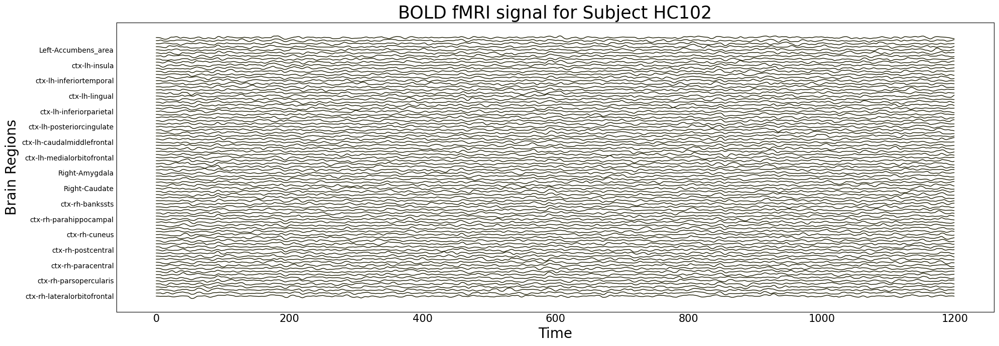

In [9]:
fig, ax = plt.subplots(1,1, figsize = (20,7))
plot_multichan(TS[idx].T, ax, df_info.ROIs.to_list())
ax.set_ylabel('Brain Regions', fontsize = 20)
ax.set_xlabel('Time', fontsize = 20)
ax.set_title('BOLD fMRI signal for Subject %s'%idx, fontsize = 25)

plt.tight_layout()

## Compute functional connectivity

In [10]:
def correlation(ts, normalize=True):
    """
    Correlation-based functional connectivity captures the linear co-fluctuation between regional BOLD signals
    i.e., regions whose activity rises and falls together are considered functionally connected.

    Parameters
    ----------
    ts : np.ndarray
        Time series matrix of shape (T x N) where T = time points, N = ROIs.
    normalize : bool, optional
        Whether to scale the correlation matrix to [0,1].

    Returns
    -------
    np.ndarray
        (N x N) symmetric correlation matrix (normalized if requested).
    """
    corr_mat = np.corrcoef(ts.T)
    np.fill_diagonal(corr_mat, 0)
    if normalize:
        corr_norm = (corr_mat - corr_mat.min()) / (corr_mat.max() - corr_mat.min())
        corr_norm = (corr_norm + corr_norm.T) / 2  # enforce symmetry
        return corr_norm
    else:
        return corr_mat

def coherence_phase(ts, fs=1.0, fmin=0.01, fmax=0.1):
    """
    Coherence-based functional connectivity quantifies the frequency-domain synchrony between signals i.e.,
    how consistently two regions oscillate together within a specific frequency band (e.g., 0.01–0.1 Hz in resting-state fMRI).

    Parameters
    ----------
    ts : np.ndarray
        Time series matrix (T x N)
    fs : float, optional
        Sampling frequency in Hz.
    fmin, fmax : float, optional
        Frequency band of interest (in Hz).

    Returns
    -------
    coh_phase : np.ndarray
        (N x N) coherence phase matrix (phase difference between signals).
    """
    duration, N = ts.shape
    coh_phase = np.zeros((N, N))

    for i in range(N):
        for j in range(i+1, N):
            f, Pxy = signal.csd(ts[:, i], ts[:, j], fs=fs, nperseg=20)
            band = (f >= fmin) & (f <= fmax)
            phase = np.angle(np.mean(Pxy[band]))
            coh_phase[i, j] = coh_phase[j, i] = phase

    min_val = np.min(coh_phase[np.nonzero(coh_phase)])
    max_val = np.max(coh_phase)
    coh_phase = (coh_phase - min_val) / (max_val - min_val)
    np.fill_diagonal(coh_phase, 0.0)

    return coh_phase


def mutual_information(ts, n_bins=20, normalize=True):
    """
    Mutual information-based connectivity captures nonlinear dependencies between regional signals
    i.e., it measures how much knowing the activity of one region reduces uncertainty about another, beyond simple linear correlation.

    Parameters
    ----------
    ts : np.ndarray
        Time series matrix (T x N)
    n_bins : int, optional
        Number of bins used for discretizing the signals.
    normalize : bool, optional
        Whether to scale the MI values to [0,1].

    Returns
    -------
    np.ndarray
        (N x N) symmetric matrix of mutual information values.
    """
    duration, N = ts.shape
    disc = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='quantile')
    binned = disc.fit_transform(ts)
    mi_mat = np.zeros((N, N))
    for i in range(N):
        for j in range(i + 1, N):
            mi = mutual_info_score(binned[:, i], binned[:, j])
            mi_mat[i, j] = mi_mat[j, i] = mi
    np.fill_diagonal(mi_mat, 0)
    if normalize:
        min_val = np.min(mi_mat)
        max_val = np.max(mi_mat)
        mi_norm = (mi_mat - min_val) / (max_val - min_val)
        return mi_norm
    else:
        return(mi_mat)

def euclidean_dist(ts):
    """
    Euclidean-distance connectivity reflects dissimilarity of activation profiles;
    regions with more similar temporal dynamics have smaller distances (and thus higher inverse similarity when inverted).

    Parameters
    ----------
    ts : np.ndarray
        Time series matrix (T x N)

    Returns
    -------
    np.ndarray
        (N x N) matrix of inverted normalized Euclidean similarities (higher = more similar).
    """
    eucl_mat = squareform(pdist(ts.T, metric='euclidean'))

    min_val = np.min(eucl_mat[np.nonzero(eucl_mat)])
    max_val = np.max(eucl_mat)
    eucl_norm = (eucl_mat - min_val) / (max_val - min_val)
    eucl_norm = 1 - eucl_norm
    np.fill_diagonal(eucl_norm, 0.0)
    return eucl_norm

In [11]:
# Create a dictionary (key-value pairs) that stores different types of adjacency matrices
# Each matrix represents pairwise relationships between brain regions (ROIs) computed
# using different similarity or distance measures applied to the time series (TS) data.

np.random.seed(42)
idx = np.random.choice(subject_ids) # pick a random subject

adjacency_matrices = {
    "cross_corr": correlation(TS[idx]),          # Pearson correlation between ROI time series
    "euclidean_distance": euclidean_dist(TS[idx]),  # Euclidean (spatial) distance between ROI signals
    "mutual_information": mutual_information(TS[idx]),  # Nonlinear dependence between ROI signals
    "coherence_phase": coherence_phase(TS[idx])        # Frequency-domain coherence (phase relationship)
}

# Loop through each connectivity measure in the dictionary
for measure_name, adj in adjacency_matrices.items():

    # Print the measure name and the shape of the corresponding matrix
    print(f"\nMeasure: {measure_name}")
    print(f"The shape of the adjacency matrix is {adj.shape}")

    # Check whether the graph is directed or undirected
    if np.all(adj == adj.T):
        print("This graph is undirected.")
    else:
        print("This graph is directed.")


Measure: cross_corr
The shape of the adjacency matrix is (85, 85)
This graph is undirected.

Measure: euclidean_distance
The shape of the adjacency matrix is (85, 85)
This graph is undirected.

Measure: mutual_information
The shape of the adjacency matrix is (85, 85)
This graph is undirected.

Measure: coherence_phase
The shape of the adjacency matrix is (85, 85)
This graph is undirected.


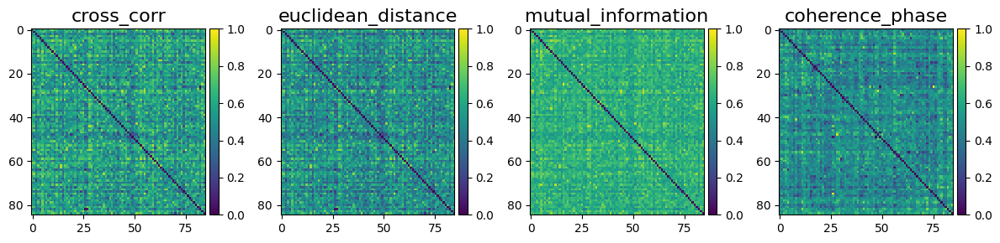

In [12]:
fig,ax = plt.subplots(1,4,figsize= (12,3))
for i, (key, adj) in enumerate(adjacency_matrices.items()):
    im1 = ax[i].imshow(adj, aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[i].set_title(key, fontsize = 16)
plt.tight_layout()

## Threshold/Binarize connectivity

In [13]:
def threshold_by_percentile(array, percent, binarize=False):
    """
    Threshold matrix by percentile of edge weights.

    Parameters
    ----------
    array : ndarray
        Input matrix (e.g., adjacency matrix).
    percent : float
        Fraction (0–1). Retains top (1 - percent) edges.
    binarize : bool
        If True, outputs 1 for edges above threshold instead of weights.

    Returns
    -------
    mask : ndarray
        Thresholded (and optionally binarized) matrix.
    """
    weights = array[np.nonzero(array)]
    idc = np.argsort(weights)
    sorted_weights = weights[idc]
    full_length = sorted_weights.shape[0]

    # Indices of surviving edges
    keep_idx = idc[int(full_length * percent):]
    rows = np.nonzero(array)[0][keep_idx]
    cols = np.nonzero(array)[1][keep_idx]

    mask = np.zeros_like(array)
    if binarize:
        mask[rows, cols] = 1
    else:
        mask[rows, cols] = array[rows, cols]
    return(mask)


def threshold_by_value(array, thresh, binarize=False):
    """
    Threshold matrix by absolute value.

    Parameters
    ----------
    array : ndarray
        Input matrix.
    thresh : float
        Minimum value to keep.
    binarize : bool
        If True, outputs 1 for edges above threshold instead of weights.

    Returns
    -------
    mask : ndarray
        Thresholded (and optionally binarized) matrix.
    """
    mask = np.zeros_like(array)
    if binarize:
        mask[array >= thresh] = 1
    else:
        mask[array >= thresh] = array[array >= thresh]
    return(mask)

In [14]:
# Define a list of thresholds to apply to the connectivity matrices.
# Each value represents either a percentile cutoff (0–1 scale)
# or an absolute edge-weight cutoff used to binarize or sparsify the network.
thresholds = [0.0, 0.2, 0.4, 0.6, 0.8]

# Initialize an empty dictionary that will store the thresholded versions
# of each adjacency matrix, across both thresholding methods and thresholds.
thresholded_adjacency_matrices = {}

# Loop over each connectivity measure (e.g., correlation, mutual information, etc.)
for i, (key, adj) in enumerate(adjacency_matrices.items()):

    # Loop over each threshold level
    for thresh in thresholds:

        # Apply percentile-based thresholding:
        # Keeps only the top X% of strongest connections (edges)
        # and sets all weaker ones to zero.
        thresholded_adjacency_matrices[key, 'percentage', thresh] = threshold_by_percentile(adj, thresh)

        # Apply value-based thresholding:
        # Keeps only edges whose weights are above a fixed numeric value (e.g., > 0.4).
        thresholded_adjacency_matrices[key, 'value', thresh] = threshold_by_value(adj, thresh)

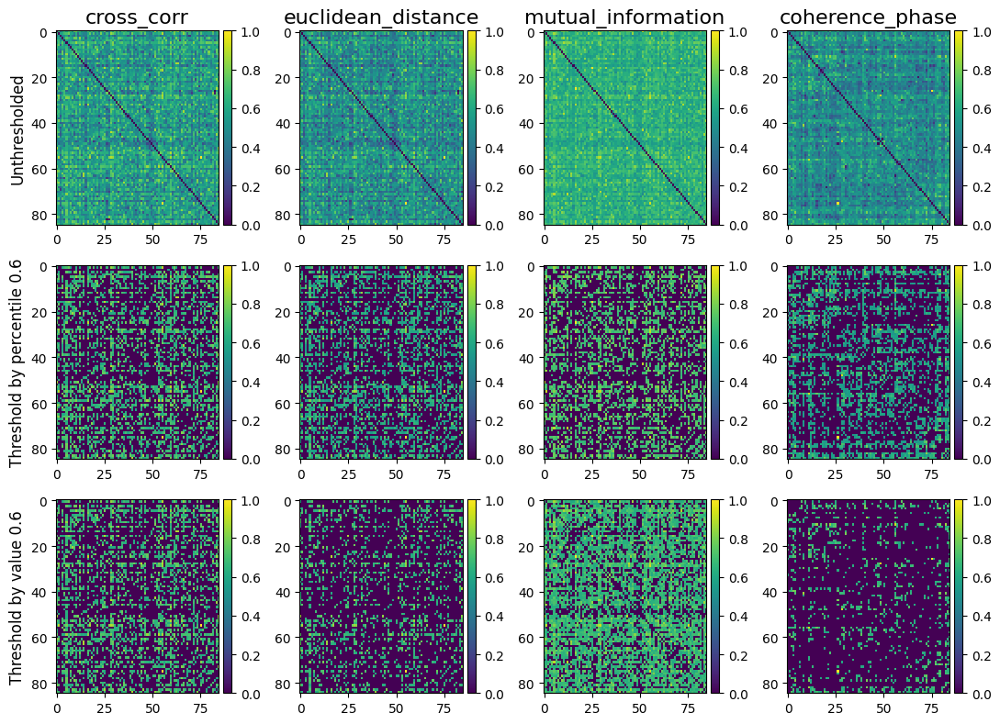

In [15]:
thresh = 0.6

fig,ax = plt.subplots(3,4,figsize= (11,8))
for i, (key, adj) in enumerate(adjacency_matrices.items()):
    im1 = ax[0][i].imshow(adj, aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[0][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[0][i].set_title(key, fontsize = 16)
    ax[0][0].set_ylabel("Unthresholded", fontsize = 12)

    im1 = ax[1][i].imshow(thresholded_adjacency_matrices[key, 'percentage', thresh], aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[1][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[1][0].set_ylabel("Threshold by percentile %.1f"%thresh, fontsize = 12)

    im1 = ax[2][i].imshow(thresholded_adjacency_matrices[key, 'value', thresh], aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[2][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[2][0].set_ylabel("Threshold by value %.1f"%thresh, fontsize = 12)
plt.tight_layout()

In [16]:
# Initialize an empty dictionary to store all binarized adjacency matrices.
# Each entry will correspond to one connectivity measure (e.g., correlation),
# one thresholding method ('percentage' or 'value'), and one threshold level.
binarized_adjacency_matrices = {}

# Loop over each adjacency matrix (i.e., each connectivity measure)
for i, (key, adj) in enumerate(adjacency_matrices.items()):

    # Loop over each threshold value defined earlier (e.g., 0.0, 0.2, 0.4, 0.6, 0.8)
    for thresh in thresholds:

        # --- Percentile-based thresholding (binarized) ---
        # Keeps only the top X% of the strongest edges and sets them to 1 (connected),
        # while weaker edges are set to 0 (not connected).
        # Result: an N×N binary (0/1) adjacency matrix representing network topology only.
        binarized_adjacency_matrices[key, 'percentage', thresh] = threshold_by_percentile(adj, thresh, binarize=True)

        # --- Value-based thresholding (binarized) ---
        # Keeps edges whose weight is above a fixed numeric cutoff (e.g., > 0.4) and sets them to 1.
        # Weaker edges are set to 0.
        binarized_adjacency_matrices[key, 'value', thresh] = threshold_by_value( adj, thresh, binarize=True)

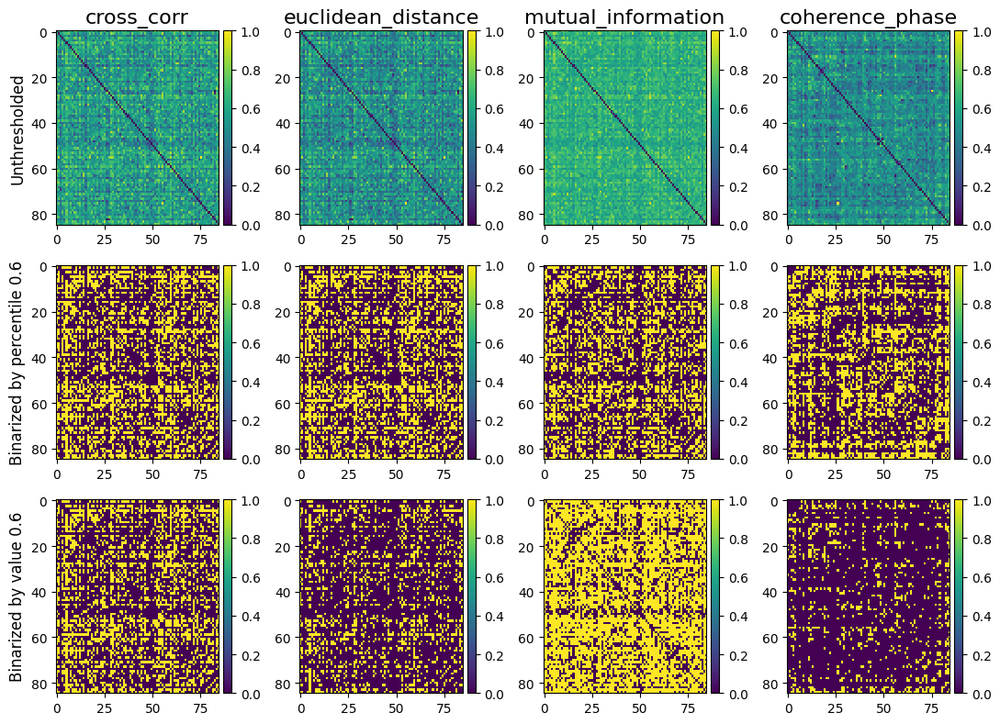

In [17]:
thresh = 0.6

fig,ax = plt.subplots(3,4,figsize= (11,8))
for i, (key, adj) in enumerate(adjacency_matrices.items()):
    im1 = ax[0][i].imshow(adj, aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[0][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[0][i].set_title(key, fontsize = 16)
    ax[0][0].set_ylabel("Unthresholded", fontsize = 12)

    im1 = ax[1][i].imshow(binarized_adjacency_matrices[key, 'percentage', thresh], aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[1][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[1][0].set_ylabel("Binarized by percentile %.1f"%thresh, fontsize = 12)

    im1 = ax[2][i].imshow(binarized_adjacency_matrices[key, 'value', thresh], aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[2][i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[2][0].set_ylabel("Binarized by value %.1f"%thresh, fontsize = 12)
plt.tight_layout()

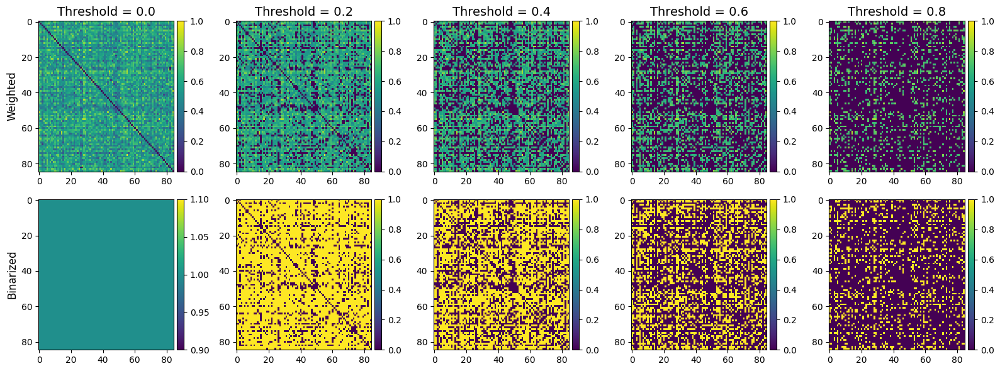

In [18]:
key = "cross_corr"                       # focus only on cross-correlation

fig, ax = plt.subplots(2, len(thresholds), figsize=(16, 6))
for j, thresh in enumerate(thresholds):

    # ---- FIRST ROW: Weighted adjacency matrices ----
    im1 = ax[0][j].imshow(thresholded_adjacency_matrices[key, 'percentage', thresh], aspect='auto', interpolation='none')
    divider = make_axes_locatable(ax[0][j])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[0][j].set_title(f"Threshold = {thresh:.1f}", fontsize=14)
    if j == 0:
        ax[0][j].set_ylabel("Weighted", fontsize=12)

    # ---- SECOND ROW: Binarized adjacency matrices ----
    im2 = ax[1][j].imshow(binarized_adjacency_matrices[key, 'percentage', thresh], aspect='auto', interpolation='none')
    divider = make_axes_locatable(ax[1][j])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im2, cax=cax)
    if j == 0:
        ax[1][j].set_ylabel("Binarized", fontsize=12)

plt.tight_layout()

## Create graph objects using igraph library

In [19]:
def make_igraph(adj: np.ndarray, drctd: bool = False) -> ig.Graph:
    """
    Create an igraph Graph from an adjacency matrix.

    https://python.igraph.org/en/stable/

    Parameters
    ----------
    adj : np.ndarray
        Square adjacency matrix (weighted or unweighted).
    drctd : bool, default=False
        If True, create a directed graph.

    Returns
    -------
    ig.Graph
        Graph with edge weights stored in 'weight' attribute.
    """
    size, _ = adj.shape

    if drctd:
        conn_indices = np.where(adj)
    else:
        # Only take upper triangle (i < j)
        conn_indices = np.where(np.triu(adj, 1))

    weights = adj[conn_indices]
    edges = list(zip(*conn_indices))

    G = ig.Graph(n=size, edges=edges, directed=drctd)
    G.es['weight'] = list(weights)
    return G

In [20]:
# Select which connectivity measure to use for building the graphs.
# In this case, we are using the cross-correlation adjacency matrices.
key = "cross_corr"

# --------------------------------------------------------------
# Build weighted and binarized graphs for each threshold value
# --------------------------------------------------------------

# Create a dictionary of weighted igraph.Graph objects.
# Each graph corresponds to a version of the cross-correlation matrix
# thresholded by *absolute value* (not by percentile).
# Setting drctd=False makes sure the graphs are treated as undirected,
# which is appropriate since correlation matrices are symmetric.
G_weighted = {thresh: make_igraph(thresholded_adjacency_matrices[key, 'value', thresh], drctd=False) for thresh in thresholds}

# Create a dictionary of binarized igraph.Graph objects for the same thresholds.
# These graphs have only 0/1 edges (indicating the presence or absence of a connection),
# rather than continuous weights.
G_binarized = {thresh: make_igraph(binarized_adjacency_matrices[key, 'value', thresh], drctd=False) for thresh in thresholds}

# Define a list of colors (one per threshold) to use in plotting or visualization later.
# This helps visually distinguish graphs corresponding to different thresholds.
colors = ['red', 'blue', 'orange', 'brown', 'green']

In [21]:
# Let's pick one graph at a given threshold (for example, threshold = 0.6)
thresh = 0.6
G = G_binarized[thresh]  # get the graph object

print(f"\n--- Graph properties for threshold = {thresh} ---")

# 1. Basic graph info
print("Is the graph directed?:", G.is_directed())     # should be False for undirected FC graphs
print("Number of nodes (vertices):", G.vcount())       # total number of ROIs
print("Number of edges:", G.ecount())                  # total number of existing connections

# 2. Vertex-level information
print("\n--- Vertex information ---")
print("List of vertex IDs:", G.vs.indices[:10], "...") # shows first 10 vertex indices

# 3. Edge-level information
print("\n--- Edge information ---")
print("List of first 5 edges (node indices):", G.get_edgelist()[:5])   # each edge as (source, target)
if "weight" in G.es.attributes():
    print("First 5 edge weights:", G.es["weight"][:5])                 # print weights of first 5 edges

# 4. Optional: get a quick summary description
print("\n--- igraph summary ---")
print(G.summary())


--- Graph properties for threshold = 0.6 ---
Is the graph directed?: False
Number of nodes (vertices): 85
Number of edges: 1331

--- Vertex information ---
List of vertex IDs: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] ...

--- Edge information ---
List of first 5 edges (node indices): [(0, 1), (0, 4), (0, 6), (0, 7), (0, 9)]
First 5 edge weights: [np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0)]

--- igraph summary ---
IGRAPH U-W- 85 1331 -- 
+ attr: weight (e)


(np.float64(-445.1910543868414),
 np.float64(437.3569977427728),
 np.float64(-424.9947811424112),
 np.float64(423.44579200520195))

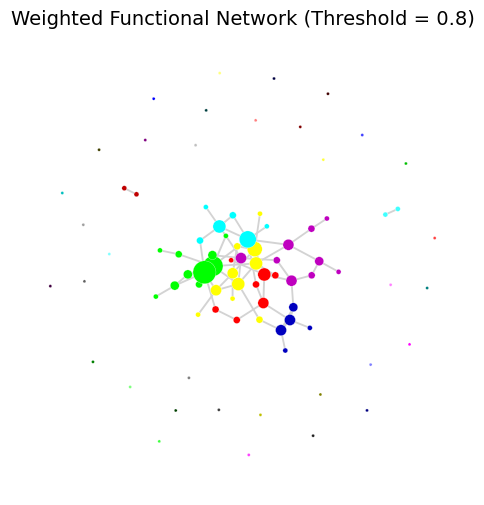

In [22]:
# Pick one threshold level to visualize
thresh = 0.8
G = G_weighted[thresh]

# ------------------------------------------------------
# Compute visual properties for nodes and edges
# ------------------------------------------------------

# Node degree or strength for sizing nodes
if "weight" in G.es.attributes():
    strengths = G.strength(weights="weight")
    node_size = [3 + (s / max(strengths)) * 20 for s in strengths]  # scale nicely
else:
    degrees = G.degree()
    node_size = [3 + (d / max(degrees)) * 20 for d in degrees]

# Node color by detected community (using multilevel / Louvain algorithm)
communities = G.community_multilevel(weights="weight")

# Generate a palette of distinct colors (one per community)
palette = ig.drawing.colors.ClusterColoringPalette(len(communities))

# Assign a color to each vertex based on its community membership
node_color = [palette[i] for i in communities.membership]

weights = np.array(G.es["weight"])
edge_width = 0.5 + (weights / weights.max())

# Choose a visually appealing layout (Fruchterman–Reingold or Kamada–Kawai)
layout = G.layout("graphopt")

# ------------------------------------------------------
# Plot the network
# ------------------------------------------------------

fig, ax = plt.subplots(figsize=(6, 6))
ig.plot(G, layout=layout, target=ax, vertex_size=node_size, vertex_color=node_color, vertex_frame_width=0.2, vertex_frame_color="white",
        vertex_label=None,  # omit ROI labels for clarity
        edge_width=edge_width,
        edge_color="lightgray",
        background="white",
        bbox=(600, 600),
        margin=60)

ax.set_title(f"Weighted Functional Network (Threshold = {thresh})", fontsize=14)
plt.axis("off")

## Compute degree and strength

In [23]:
def compute_degrees(G: ig.Graph) -> np.ndarray:
    """
    Compute node degrees for a graph.

    Parameters
    ----------
    G : ig.Graph
        Graph to analyze.

    Returns
    -------
    degrees : np.ndarray
        array of node degrees (length = n_nodes).
    """
    degrees = np.array(G.degree(mode='all'))
    return degrees

def compute_strengths(G: ig.Graph) -> np.ndarray:
    """
    Compute node strengths for a graph.

    Parameters
    ----------
    G : ig.Graph
        Graph to analyze.

    Returns
    -------
    strengths : np.ndarray
        array of node strengths (length = n_nodes).
    """
    strengths = np.array(G.strength(mode='all', weights='weight'))
    return strengths

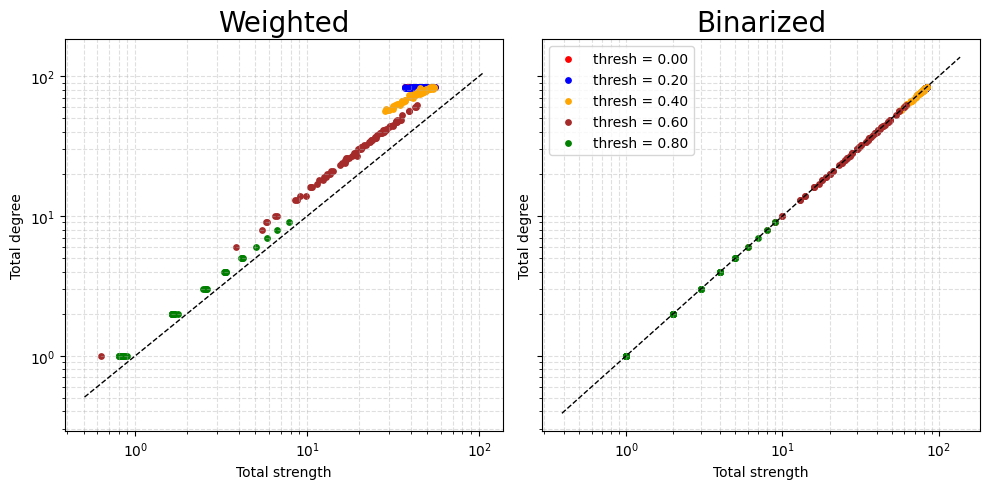

In [24]:
# compute degree and strength for each threshold
W_degrees = {thresh:compute_degrees(G) for thresh, G in G_weighted.items()}
W_strengths = {thresh:compute_strengths(G) for thresh, G in G_weighted.items()}

B_degrees = {thresh:compute_degrees(G) for thresh, G in G_binarized.items()}
B_strengths = {thresh:compute_strengths(G) for thresh, G in G_binarized.items()}

fig, ax = plt.subplots(1,2, figsize=(10,5), sharey=True)
for i, thresh in enumerate(thresholds):
    ax[0].scatter(W_strengths[thresh], W_degrees[thresh], s=15, c=colors[i], label = 'thresh = %.2f'%thresh)
    ax[1].scatter(B_strengths[thresh], B_degrees[thresh], s=15, c=colors[i], label = 'thresh = %.2f'%thresh)
ax[0].set_xscale('log');ax[0].set_yscale('log')
ax[0].set_xlabel('Total strength')
ax[0].set_ylabel('Total degree')
ax[0].set_title('Weighted', fontsize = 20)
ax[0].grid(True, which='both', ls='--', alpha=0.4)
min_val = min(ax[0].get_xlim()[0], ax[0].get_ylim()[0])
max_val = max(ax[0].get_xlim()[1], ax[0].get_ylim()[1])
ax[0].plot([min_val, max_val], [min_val, max_val], 'k--', lw=1) # dashed x=y reference line

ax[1].set_xscale('log');ax[1].set_yscale('log')
ax[1].set_xlabel('Total strength')
ax[1].set_ylabel('Total degree')
ax[1].set_title('Binarized', fontsize = 20)
ax[1].grid(True, which='both', ls='--', alpha=0.4)
min_val = min(ax[1].get_xlim()[0], ax[1].get_ylim()[0])
max_val = max(ax[1].get_xlim()[1], ax[1].get_ylim()[1])
ax[1].plot([min_val, max_val], [min_val, max_val], 'k--', lw=1) # dashed x=y reference line
ax[1].legend()

plt.tight_layout()
plt.show()

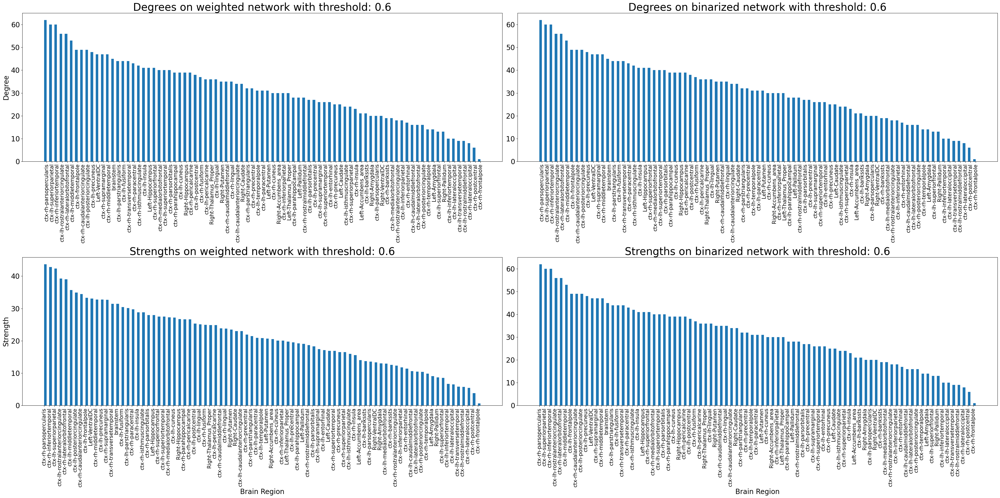

In [25]:
thresh = 0.6

fig, ax = plt.subplots(2, 2, figsize=(40, 20))
# ---------- Weighted graph (left panel) ----------
order = np.argsort(W_degrees[thresh])[::-1]# ---- sort order by degree height (descending) ----
ax[0][0].bar(np.arange(n_rois) - 0.25, W_degrees[thresh][order], 0.5)
ax[0][0].set_title(f"Degrees on weighted network with threshold: {thresh}", fontsize=30)
ax[0][0].set_ylabel('Degree', fontsize = 20)
ax[0][0].set_xticks(np.arange(n_rois))
ax[0][0].set_xticklabels(df_info.ROIs.to_numpy()[order], rotation=90, fontsize=15)
ax[0][0].tick_params(axis='y', labelsize=20)

order = np.argsort(W_strengths[thresh])[::-1] # ---- sort order by strength height (descending) ----
ax[1][0].bar(np.arange(n_rois) + 0.25, W_strengths[thresh][order], 0.5)
ax[1][0].set_title(f"Strengths on weighted network with threshold: {thresh}", fontsize=30)
ax[1][0].set_ylabel('Strength', fontsize= 20)
ax[1][0].set_xticks(np.arange(n_rois))
ax[1][0].set_xticklabels(df_info.ROIs.to_numpy()[order], rotation=90, fontsize=15)
ax[1][0].set_xlabel('Brain Region', fontsize =20)
ax[1][0].tick_params(axis='y', labelsize=20)

# ---------- Binarized graph (right panel) ----------
order = np.argsort(B_degrees[thresh])[::-1] # ---- sort order by degree height (descending) ----
ax[0][1].bar(np.arange(n_rois) - 0.25, B_degrees[thresh][order], 0.5)
ax[0][1].set_title(f"Degrees on binarized network with threshold: {thresh}", fontsize=30)
ax[0][1].set_xticks(np.arange(n_rois))
ax[0][1].set_xticklabels(df_info.ROIs.to_numpy()[order], rotation=90, fontsize=15)
ax[0][1].tick_params(axis='y', labelsize=20)

order = np.argsort(B_strengths[thresh])[::-1] # ---- sort order by strength height (descending) ----
ax[1][1].bar(np.arange(n_rois) + 0.25, B_strengths[thresh][order], 0.5)
ax[1][1].set_title(f"Strengths on binarized network with threshold: {thresh}", fontsize=30)
ax[1][1].set_xticks(np.arange(n_rois))
ax[1][1].set_xticklabels(df_info.ROIs.to_numpy()[order], rotation=90, fontsize=15)
ax[1][1].set_xlabel('Brain Region', fontsize = 20)
ax[1][1].tick_params(axis='y', labelsize=20)

plt.tight_layout()

## Survival analysis

In [26]:
def survival_by_weight(G: ig.Graph) -> tuple[np.ndarray, np.ndarray]:
    """
    Compute the edge–weight survival curve* of a graph.
    ------------------------
    Let the multiset of positive edge weights be
        W = { w_1, w_2, ..., w_m } .
    After sorting them in non-decreasing order
        w_(1) ≤ w_(2) ≤ ... ≤ w_(m) ,
    the survival function S(t) is defined as
        S(t) = P[w ≥ t]
             = 1 - F(t)
             = 1 - ( #{ w_i : w_i ≤ t } / m ).
    --------------------------

    Parameters
    ----------
    G : ig.Graph
        Graph whose positive edge weights will be analyzed.

    Returns
    -------
    w_sorted : np.ndarray
        Sorted positive edge weights (ascending).
    surv : np.ndarray
        Survival probabilities S(w_sorted) = 1 - rank / m .
    """
    w = np.array(G.es['weight'])
    w = w[w > 0]
    w_sorted = np.sort(w)
    surv = 1.0 - np.arange(1, len(w_sorted)+1) / len(w_sorted)
    return(w_sorted, surv)

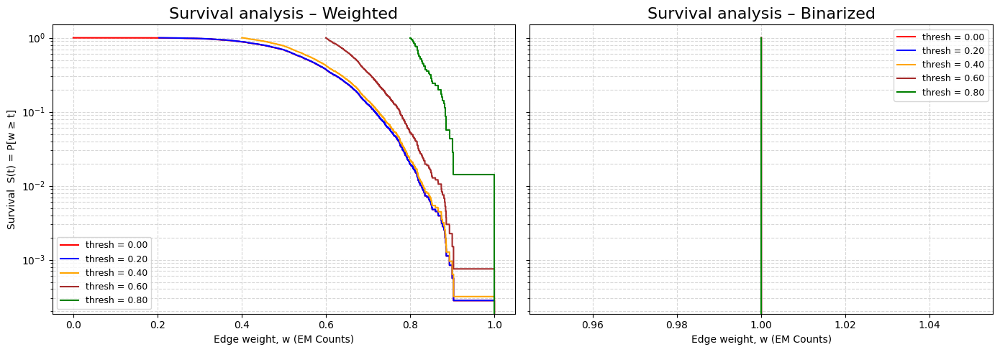

In [27]:
#If I progressively raise the weight threshold, what fraction of edges survive above that threshold?

    # The survival curve describes how the network’s connectivity persists as edges are progressively *thresholded* from strongest to weakest weights.
    # Large plateaus in S(t) indicate that many edges share similar weight magnitudes, while a slow decay of S(t) signals the presence of numerous
    # strong (high-weight) connections. From a network topology perspective, S(t) captures the robustness of the weighted graph: a slower
    # decline corresponds to a more strongly connected or “topologically resilient” network under weight filtration.

# compute survival probabilities
W_surv_weight = {thresh:survival_by_weight(G) for thresh, G in G_weighted.items()}
B_surv_weight = {thresh:survival_by_weight(G) for thresh, G in G_binarized.items()}

fig, axes = plt.subplots(1, 2, figsize=(14,5), sharey=True)
# ---------- Weighted graphs (left panel) ----------
for i, (thresh, surv) in enumerate(W_surv_weight.items()):
    axes[0].step(surv[0], surv[1], where='post',c=colors[i % len(colors)],label=f"thresh = {thresh:.2f}")
axes[0].set_yscale('log')
axes[0].grid(True, which='both', ls='--', alpha=0.5)
axes[0].set_title("Survival analysis – Weighted", fontsize=16)
axes[0].set_xlabel('Edge weight, w (EM Counts)')
axes[0].set_ylabel('Survival  S(t) = P[w ≥ t]')
axes[0].legend(loc='best', fontsize=9)

# ---------- Binarized graphs (right panel) ----------
for i, (thresh, surv) in enumerate(B_surv_weight.items()):
    axes[1].step(surv[0], surv[1], where='post', c=colors[i % len(colors)],label=f"thresh = {thresh:.2f}")
axes[1].set_yscale('log')
axes[1].grid(True, which='both', ls='--', alpha=0.5)
axes[1].set_title("Survival analysis – Binarized", fontsize=16)
axes[1].set_xlabel('Edge weight, w (EM Counts)')
axes[1].legend(loc='best', fontsize=9)

plt.tight_layout()
plt.show()

## Compute path lengths

In [28]:
def compute_pathlengths(G: ig.Graph, weighted: bool = False) -> np.ndarray:
    """
    Compute all shortest–path lengths of a graph (weighted/unweighted).

    Parameters
    ----------
    G : ig.Graph
        Graph to analyze.
    weighted : bool, default=False
        If True, use edge weights for shortest paths. If False, treat graph as unweighted.

    Returns
    -------
    d : np.ndarray
        Array of shortest–path lengths (hops if unweighted, weighted distances if weighted) for all distinct vertex pairs in the largest component.
    """
    directed = True if G.is_directed() else False

    # --- select weights ---
    weights = "weight" if (weighted and "weight" in G.es.attributes()) else None
    # --- compute path lengths distances ---
    dist = np.array(G.distances(weights=weights, mode="all" if not directed else "out"))
    # keep only finite, nonzero distances
    d = dist[np.isfinite(dist)]
    d = d[d > 0]
    return(d)

def compute_mean_pathlengths(G: ig.Graph, weighted: bool = False) -> np.ndarray:
    """
    Compute node-wise shortest-path lengths for a graph.

    Parameters
    ----------
    G : ig.Graph
        Graph to analyze.
    weighted : bool, default=False
        If True, use edge weights for shortest paths. If False, treat graph as unweighted.

    Returns
    -------
    mean_path_len : np.ndarray
        (1 × N) array of mean path lengths for each node where N = number of nodes in the graph.
    """
    n = G.vcount()
    weights = "weight" if (weighted and "weight" in G.es.attributes()) else None
    path_len = np.array([G.distances(source=i, weights=weights)[0] for i in range(n)])
    mean_path_len = np.array([np.mean(pl[np.isfinite(pl)]) for pl in path_len])
    return mean_path_len

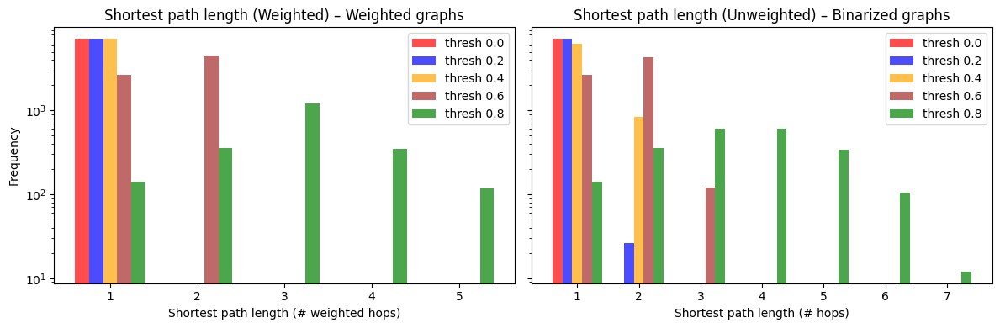

In [29]:
W_path_lengths = {thresh: compute_pathlengths(G, weighted=True) for thresh, G in G_weighted.items()}
B_path_lengths = {thresh: compute_pathlengths(G, weighted=False) for thresh, G in G_binarized.items()}

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
# ---------- Weighted ----------
data_W   = [W_path_lengths[t] for t in thresholds]
labels_W = [f"thresh {t}" for t in thresholds]
num_bins_W = int(np.max(np.concatenate(data_W)))

# Draw histogram and capture returned info
n_W, bins_W, patches_W = axes[0].hist(data_W, bins=num_bins_W, alpha=0.7, log=True,color=colors[:len(data_W)], label=labels_W, histtype='bar')

# bin centres: exactly the middle of each 4-bar cluster
centres_W = 0.5 * (bins_W[:-1] + bins_W[1:])
axes[0].set_xticks(centres_W)
axes[0].set_xticklabels([f"{c:.0f}" for c in centres_W])   # or format as you like
axes[0].set_title('Shortest path length (Weighted) – Weighted graphs')
axes[0].set_xlabel('Shortest path length (# weighted hops)')
axes[0].set_ylabel('Frequency')
axes[0].legend()

# ---------- Binarized ----------
data_B   = [B_path_lengths[t] for t in thresholds]
labels_B = [f"thresh {t}" for t in thresholds]
num_bins_B = len(np.unique(np.concatenate(data_B)))

n_B, bins_B, patches_B = axes[1].hist(data_B, bins=num_bins_B, alpha=0.7, log=True,color=colors[:len(data_B)], label=labels_B, histtype='bar')

centres_B = 0.5 * (bins_B[:-1] + bins_B[1:])
axes[1].set_xticks(centres_B)
axes[1].set_xticklabels([f"{c:.0f}" for c in centres_B])
axes[1].set_title('Shortest path length (Unweighted) – Binarized graphs')
axes[1].set_xlabel('Shortest path length (# hops)')
axes[1].legend()

plt.tight_layout()
plt.show()

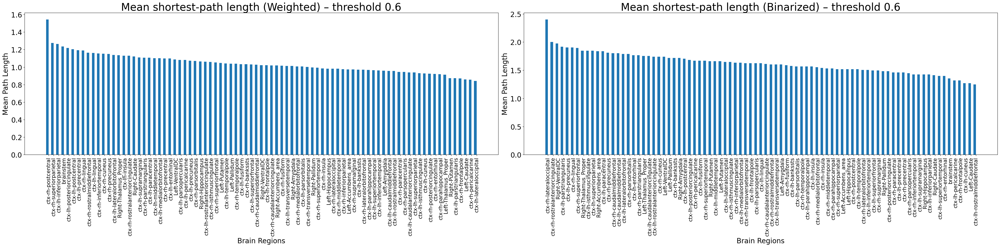

In [30]:
# --- compute path lengths for every node, for each threshold ---
W_path_lengths_all = {thresh: compute_mean_pathlengths(G, weighted=True) for thresh, G in G_weighted.items()}
B_path_lengths_all = {thresh: compute_mean_pathlengths(G, weighted=False) for thresh, G in G_binarized.items()}

# choose a threshold to display
thresh = thresholds[3]

fig, ax = plt.subplots(1, 2, figsize=(40, 10))
# ---------- Weighted graph ----------
order = np.argsort(W_path_lengths_all[thresh])[::-1]
ax[0].bar(np.arange(n_rois) - 0.25, W_path_lengths_all[thresh][order], 0.5)
ax[0].set_title(f"Mean shortest-path length (Weighted) – threshold {thresh}", fontsize=30)
ax[0].set_xticks(np.arange(n_rois))
ax[0].set_xticklabels(df_info.ROIs.to_numpy()[order][order], rotation=90, fontsize=15)
ax[0].set_xlabel('Brain Regions', fontsize = 20)
ax[0].tick_params(axis='y', labelsize=20)
ax[0].set_ylabel('Mean Path Length', fontsize = 20)

# ---------- Binarized graph ----------
order = np.argsort(B_path_lengths_all[thresh])[::-1]
ax[1].bar(np.arange(n_rois) - 0.25, B_path_lengths_all[thresh][order], 0.5)
ax[1].set_title(f"Mean shortest-path length (Binarized) – threshold {thresh}", fontsize=30)
ax[1].set_xticks(np.arange(n_rois))
ax[1].set_xticklabels(df_info.ROIs.to_numpy()[order][order], rotation=90, fontsize=15)
ax[1].set_xlabel('Brain Regions', fontsize = 20)
ax[1].tick_params(axis='y', labelsize=20)
ax[1].set_ylabel('Mean Path Length', fontsize = 20)

plt.tight_layout()
plt.show()

## Compute clustering coefficients

In [31]:
def compute_global_clusteringcoef(G: ig.Graph) -> tuple[np.float64, np.ndarray]:
    """
    Compute globalclustering coefficients using igraph.

    Parameters
    ----------
    G : ig.Graph
        Input graph (undirected). If directed, igraph treats it as undirected.

    Returns
    -------
    results :
        - "global": global clustering coefficient (float)
    """
    # global clustering coefficient
    global_cc = G.transitivity_undirected(mode = 'zero')
    if global_cc == 0:
        global_cc = 0.001
    return(global_cc)

def compute_local_clusteringcoef(G: ig.Graph) -> tuple[np.float64, np.ndarray]:
    """
    Compute local clustering coefficients using igraph.

    Parameters
    ----------
    G : ig.Graph
        Input graph (undirected). If directed, igraph treats it as undirected.

    Returns
    -------
    results :
        - "local":  local clustering coefficients (np.ndarray, one per node)
    """
    # local clustering coefficients
    local_cc = np.array(G.transitivity_local_undirected(mode="zero"))
    return(local_cc)

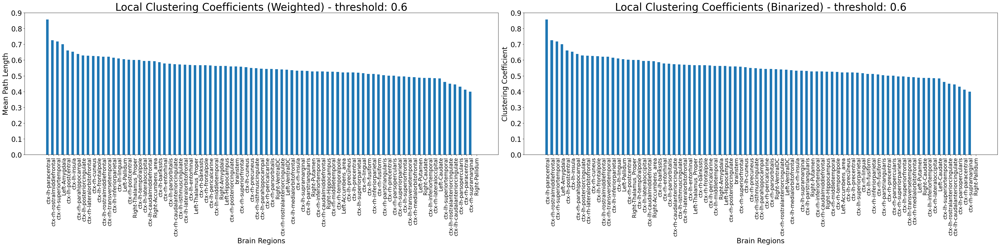

In [32]:
# --- compute clustering coefficients ---
W_clus_coef = {thresh: compute_local_clusteringcoef(G) for thresh, G in G_weighted.items()}
B_clus_coef = {thresh: compute_local_clusteringcoef(G) for thresh, G in G_binarized.items()}

thresh = thresholds[3]

fig, ax = plt.subplots(1, 2, figsize=(40, 10))
# ---------- Weighted graph (left panel) ----------
order = np.argsort(W_clus_coef[thresh])[::-1]# ---- sort order by degree height (descending) ----
ax[0].bar(np.arange(n_rois) - 0.25, W_clus_coef[thresh][order], 0.5)
ax[0].set_title(f"Local Clustering Coefficients (Weighted) - threshold: {thresh}", fontsize=30)
ax[0].set_ylabel('Value')
ax[0].set_xticks(np.arange(n_rois))
ax[0].set_xticklabels(df_info.ROIs.to_numpy()[order][order], rotation=90, fontsize=15)
ax[0].set_xlabel('Brain Regions', fontsize = 20)
ax[0].set_ylabel('Mean Path Length', fontsize = 20)
ax[0].tick_params(axis='y', labelsize=20)

# ---------- Binarized graph (right panel) ----------
order = np.argsort(B_clus_coef[thresh])[::-1] # ---- sort order by degree height (descending) ----
ax[1].bar(np.arange(n_rois) - 0.25, W_clus_coef[thresh][order], 0.5)
ax[1].set_title(f"Local Clustering Coefficients (Binarized) - threshold: {thresh}", fontsize=30)
ax[1].set_ylabel('Clustering Coefficient', fontsize = 20)
ax[1].set_xticks(np.arange(n_rois))
ax[1].set_xticklabels(df_info.ROIs.to_numpy()[order][order], rotation=90, fontsize=15)
ax[1].set_xlabel('Brain Regions', fontsize = 20)
ax[1].tick_params(axis='y', labelsize=20)

plt.tight_layout()

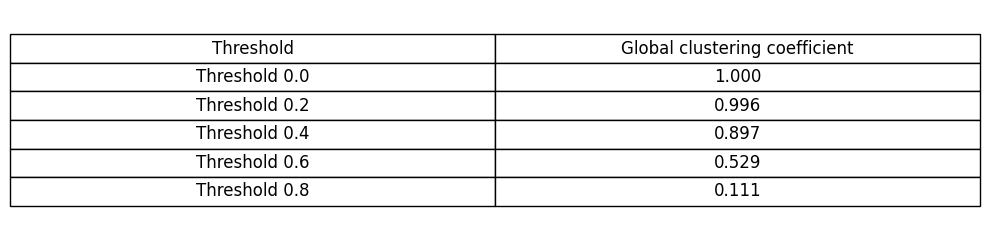

In [33]:
# --- collect clustering coefficients for each thresholded graph ---
rows = []
for thresh, G in G_weighted.items():
    global_cc = compute_global_clusteringcoef(G)
    rows.append([f"Threshold {thresh}",f"{global_cc:.3f}"])

# add header row
table_data = [["Threshold", "Global clustering coefficient"]] + rows

fig, ax = plt.subplots(figsize=(10, 2.5))
ax.axis('off')  # hide axes, we just want the table

table = ax.table(cellText=table_data,cellLoc='center',loc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 1.5)   # adjust row height for readability

plt.tight_layout()
plt.show()

## Computing small-worldedness against null models

In [34]:
def small_worldness_against_nulls(G_obs: ig.Graph, G_null: ig.Graph) -> float:
    """
    Compute SΔ = (C_obs/C_rand) / (L_obs/L_rand), with C = global clustering (undirected),
    L = mean shortest-path length within largest WCC of the undirected view.

    Small-worldness quantifies how efficiently a network balances local specialization (clustering) with global integration (short paths).

    """
    if G_null == None:
        G_null = ig.Graph.Erdos_Renyi(n = len(G_obs.vs), m = G_obs.ecount(), directed = False, loops = False)
        G_null.es['weight'] = np.random.permutation(G_obs.es['weight'])

    # observed graph stats
    global_cc_obs = compute_global_clusteringcoef(G)
    pl_obs = compute_pathlengths(G, weighted = True)

    # null stats
    global_cc_null = compute_global_clusteringcoef(G_null)
    pl_null = compute_pathlengths(G_null, weighted = True)

    S = (global_cc_obs/global_cc_null) / (pl_obs.mean()/pl_null.mean())
    return(S)

In [35]:
G_weighted_ER, G_binarized_ER = {}, {}

for thresh in thresholds:
#   Definition: connect each pair of nodes with a fixed number of edges m.
#   What it preserves: node count N, edge count M (or density).
#   What it randomizes: degree distribution, clustering, community structure, etc.
#   Purpose: benchmark for pure randomness — “if edges were placed arbitrarily, how much clustering/path efficiency would you expect?”

    G_weighted_ER[thresh] = ig.Graph.Erdos_Renyi(n = len(G_weighted[thresh].vs), m = G_weighted[thresh].ecount(), directed = False, loops = False)
    G_weighted_ER[thresh].es['weight'] = np.random.permutation(G_weighted[thresh].es['weight'])

    G_binarized_ER[thresh] = ig.Graph.Erdos_Renyi(n = len(G_binarized[thresh].vs), m = G_binarized[thresh].ecount(), directed = False, loops = False)

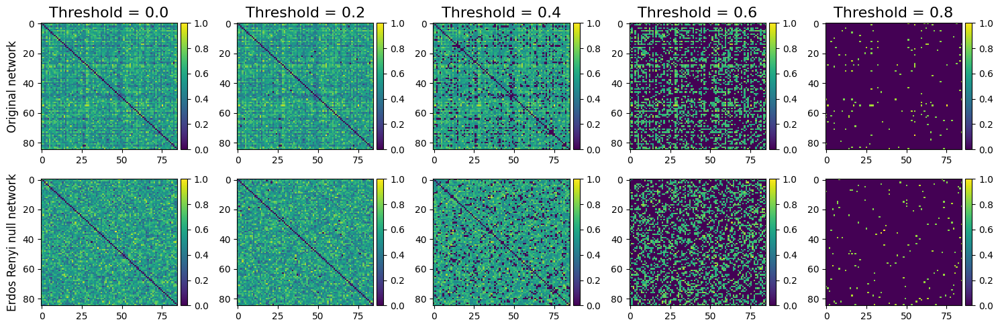

In [36]:
thresh = thresholds[3]

fig,ax = plt.subplots(2,5,figsize= (15,5))
for t, thresh in enumerate(thresholds):
    im1 = ax[0][t].imshow(np.array(G_weighted[thresh].get_adjacency(attribute='weight').data), aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[0][t])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)
    ax[0][t].set_title('Threshold = %.1f'%thresh, fontsize = 16)

    im1 = ax[1][t].imshow(np.array(G_weighted_ER[thresh].get_adjacency(attribute='weight').data), aspect = 'auto', interpolation = 'none')
    divider = make_axes_locatable(ax[1][t])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax)

ax[0][0].set_ylabel("Original network", fontsize = 12)
ax[1][0].set_ylabel("Erdos Renyi null network", fontsize = 12)
plt.tight_layout()

In [37]:
records = []
for thresh in thresholds:
    records.append({
        "Threshold": thresh,
        "Edges": 'Weighted',
        "Small-worldedness coefficient (Real vs. ER)": small_worldness_against_nulls(G_weighted[thresh], G_weighted_ER[thresh])})

    records.append({
        "Threshold": thresh,
        "Edges": 'Binarized',
        "Small-worldedness coefficient (Real vs. ER)": small_worldness_against_nulls(G_binarized[thresh], G_binarized_ER[thresh])})

# assemble dataframe
df_smallworld = pd.DataFrame(records)
df_smallworld

,Threshold,Edges,Small-worldedness coefficient (Real vs. ER)
0,0.0,Weighted,0.020337
1,0.0,Binarized,0.038425
2,0.2,Weighted,0.020894
3,0.2,Binarized,0.038706
4,0.4,Weighted,0.026977
5,0.4,Binarized,0.048741
6,0.6,Weighted,0.106627
7,0.6,Binarized,0.168107
8,0.8,Weighted,7.061797
9,0.8,Binarized,8.020761


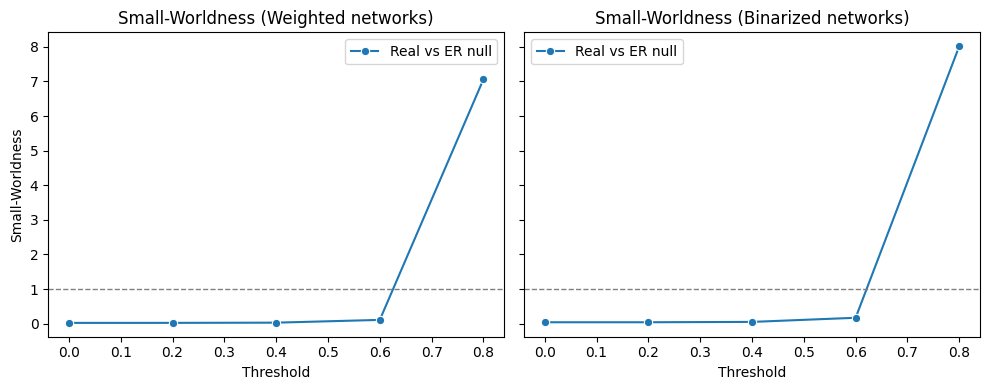

In [38]:
fig, ax = plt.subplots(1,2, figsize=(10,4), sharey = True)
for e, edges in enumerate(['Weighted', 'Binarized']):
    sns.lineplot(data=df_smallworld[df_smallworld.Edges == edges], x="Threshold", y="Small-worldedness coefficient (Real vs. ER)", label="Real vs ER null", marker="o", ax = ax[e])
    ax[e].axhline(1.0, ls="--", c="gray", lw=1)
    ax[e].set_xlabel("Threshold")
    ax[e].set_ylabel("Small-Worldness")
ax[0].set_title("Small-Worldness (Weighted networks)")
ax[1].set_title("Small-Worldness (Binarized networks)")

plt.tight_layout()

# Compute nodal centrality metrics

In [39]:
def compute_degree_centrality(G, weighted=True):
    """
    How many and how strong are the direct connections of this node? (local hub strength).
    """
    if weighted and 'weight' in G.es.attributes():
        return np.array(G.strength(weights="weight"))
    else:
        return np.array(G.degree())

def compute_betweenness_centrality(G, weighted=True):
    """
    How often does this node act as a bridge or bottleneck for communication between others? (control over information flow).
    """
    weights = "weight" if weighted else None
    return np.array(G.betweenness(weights=weights))

def compute_closeness_centrality(G, weighted=True):
    """
    How close is this node to all others, on average? (efficient access to the whole network).
    """
    weights = "weight" if weighted else None
    return np.array(G.closeness(weights=weights, normalized=True))

def compute_eigenvector_centrality(G, weighted=True):
    """
    Importance comes from being connected to other important nodes (influence in a “rich club”).
    """
    weights = "weight" if weighted else None
    return np.array(G.eigenvector_centrality(weights=weights))

def compute_all_centralities(G, weighted=True):
    """
    Compute centralities for an adjacency matrix and return stacked results.
    """
    results = {}
    results["Degree"] = compute_degree_centrality(G, weighted)
    results["Betweenness"] = compute_betweenness_centrality(G, weighted)
    results["Closeness"] = compute_closeness_centrality(G, weighted)
    results["Eigenvector"] = compute_eigenvector_centrality(G, weighted)

    return(results)

In [40]:
thresh = 0.6
results = compute_all_centralities(G_weighted[thresh], weighted = True)

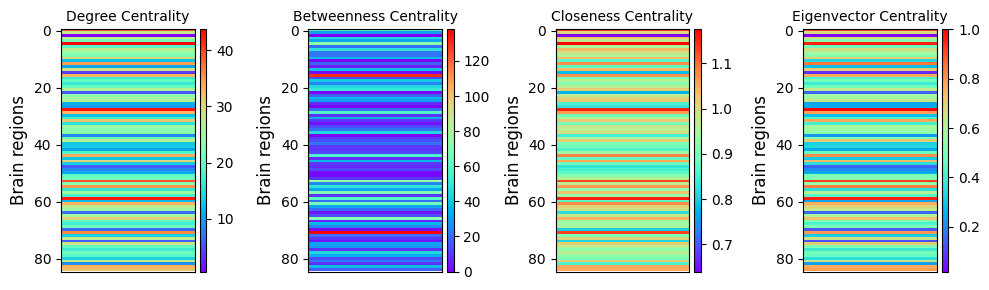

In [41]:
fig, ax = plt.subplots(1,4, figsize = (10,3))
for c, centrality in enumerate(results.keys()):
    im = ax[c].imshow(results[centrality].reshape(n_rois,1), aspect = 'auto', interpolation = 'none', cmap = 'rainbow')
    divider = make_axes_locatable(ax[c])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
    ax[c].set_title('%s Centrality'%centrality, fontsize = 10)
    ax[c].set_ylabel('Brain regions', fontsize = 12)
    ax[c].set_xticks([])
plt.tight_layout()

## Let's combine everything we learn to predict demographical variables from functional connectivity

In [42]:
def rect_state_labels(labels, ax, clr, class_labels=None):
    """
    Draw rectangles around clustered blocks in a matrix plot
    and optionally label them in the center.

    Parameters
    ----------
    labels : array-like of shape (n,)
        Cluster labels (e.g., from k-means or gender labels).
    ax : matplotlib Axes
        Axes to draw the rectangles and text on.
    clr : str or color
        Outline color for rectangles.
    class_labels : list of str, optional
        Labels to display (e.g., ['Male', 'Female']).
        If not provided, numeric labels are shown.
    """
    membs = [[] for _ in range(len(np.unique(labels)))]
    for i, label in enumerate(labels):
        membs[label].append(i)

    temp_len = 0
    for i, lbl in enumerate(membs):
        n = len(lbl)
        # Rectangle coordinates: (x0, y0, width, height)
        rect = patches.Rectangle((temp_len, temp_len), n, n, linewidth=2, edgecolor=clr, facecolor='none')
        ax.add_patch(rect)

        # Compute the center of the rectangle
        center = temp_len + n / 2.0

        # Label text
        text = class_labels[i] if class_labels is not None else str(i)

        # Add the text centered in the rectangle
        ax.text(center, center, text,ha='center', va='center', fontsize=30, color=clr, fontweight='bold')

        temp_len += n

In [43]:
df_subjects[:30]

,Subject,Gender,Age,BMI,IQ
0,HC000,M,28-36,27.8,85
1,HC001,M,18-22,36.4,78
2,HC002,M,28-36,33.4,79
3,HC003,M,22-28,29.4,83
4,HC004,M,36+,27.9,91
5,HC005,F,22-28,25.4,112
6,HC006,M,28-36,14.4,110
7,HC007,F,22-28,21.1,91
8,HC008,M,28-36,26.2,80
9,HC009,F,18-22,36.0,106


### 1) Try to cluster eigenvector centralities of functional connectivity matrices to see if eigenvector centralities predict gender.
#### Hyperparameters:
##### •Functional Connectivity: Cross Correlation
##### •Thresholding: None
##### •Predictor: Eigenvector Centrality
##### •Predicted: Subject gender


In [44]:
# Initialize an empty array to store eigenvector centrality (EVC) values for each subject (rows) and each brain region/ROI (columns).
EVC = np.zeros((n_subjects, n_rois))

# Loop through each subject by their ID
for i, idx in enumerate(subject_ids):

    # Step 1: Compute the adjacency matrix for the subject using cross correlation between all ROI time series.
    # The resulting matrix represents functional connectivity strength between every pair of brain regions.
    adjacency_matrix = correlation(TS[idx])

    # Step 2: Convert the adjacency matrix into an igraph Graph object.
    G = make_igraph(adjacency_matrix, drctd=False)

    # Step 3: Compute the eigenvector centrality (EVC) for this subject's graph.
    # EVC measures how "influential" each node is, based not only on how many connections it has, but also on the centrality of its neighbors.
    EVC[i, :] = compute_eigenvector_centrality(G, weighted=True)

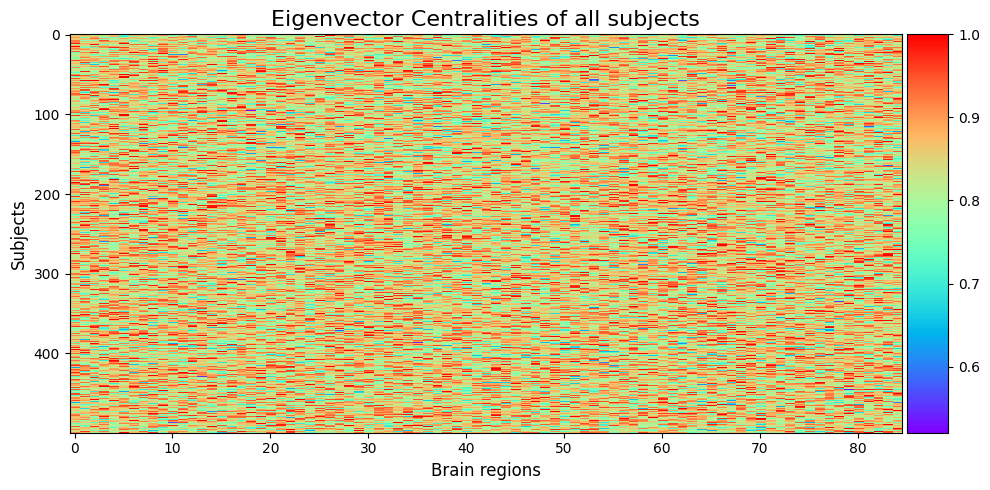

In [45]:
fig, ax = plt.subplots(1,1, figsize = (10,5))
im = ax.imshow(EVC, aspect = 'auto', interpolation = 'none', cmap = 'rainbow')
ax.set_title('Eigenvector Centralities of all subjects', fontsize = 16)
ax.set_xlabel('Brain regions', fontsize = 12)
ax.set_ylabel('Subjects', fontsize = 12)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax)
plt.tight_layout()

In [46]:
df_subjects

,Subject,Gender,Age,BMI,IQ
0,HC000,M,28-36,27.8,85
1,HC001,M,18-22,36.4,78
2,HC002,M,28-36,33.4,79
3,HC003,M,22-28,29.4,83
4,HC004,M,36+,27.9,91
...,...,...,...,...,...
495,HC495,M,22-28,25.7,99
496,HC496,M,28-36,10.6,113
497,HC497,M,28-36,14.8,96
498,HC498,F,18-22,11.6,121


In [47]:
# Extract the class labels (e.g., ['M', 'F']).
labels = np.unique(df_subjects['Gender'].to_numpy())
# -------------------------------------------------------------------------
# K-means clustering based on eigenvector centrality (EVC)
# -------------------------------------------------------------------------

# Step 1: 'Whiten' (normalize) the EVC feature matrix so that each feature (ROI) has unit variance.
# This ensures that no brain region dominates clustering simply because its values are larger in magnitude.
whitened = whiten(EVC)

# Step 2: Run k-means clustering to divide subjects into groups equal to the number of gender labels (here, 2: male and female).
# - centroid: the cluster centers
# - y_pred: the cluster assignment (0 or 1) for each subject
centroid, y_pred = kmeans2(whitened, len(labels), minit='++')

In [48]:
# Step 3: Compute a confusion matrix comparing true gender labels (y_true) with the cluster-derived predictions (y_pred),
# while accounting for the fact that k-means cluster labels (0 and 1) are arbitrary.
#
# To correctly align cluster labels with true gender labels, we test all possible permutations of the gender label encoding (e.g., M=0,F=1 or M=1,F=0)
# and choose the mapping that yields the highest overall accuracy.

# Extract the "Gender" column from the dataframe as a Python list. Example: ['M', 'F', 'F', 'M', ...]
gender = df_subjects.Gender.to_list()

# Initialize placeholders to store the best mapping results
best_acc = 0          # Highest accuracy encountered so far
best_C = None      # Confusion matrix corresponding to best accuracy
best_map = None       # Mapping dictionary (e.g., {'M':0,'F':1}) that produced best accuracy

# Define the original categorical-to-numeric mapping: ('M' → 0, 'F' → 1), though this will be permuted below.
gender_key = {'M': 0, 'F': 1}

# Loop over all possible permutations of gender label values (here, just two: [0,1] and [1,0])
for perm in permutations(gender_key.values()):

    # Reassign permuted numeric values to the same keys ('M','F')
    gender_key_perm = dict(zip(gender_key.keys(), perm))

    # Convert the true gender labels ('M'/'F') to numeric values using this permutation. np.vectorize applies the dictionary lookup element-wise across the list.
    y_true = np.vectorize(gender_key_perm.get)(gender)

    # Compute confusion matrix between true labels and predicted cluster assignments. 'normalize="true"' makes each row sum to 1 (proportion per true class).
    # The label order (0,1) is determined by the current permuted mapping.
    C = confusion_matrix(y_true, y_pred, labels=list(gender_key_perm.values()), normalize='true')

    # Compute overall accuracy as the trace (correct predictions) divided by total.
    acc = np.trace(C) / np.sum(C)

    # Update best results if this permutation yields higher accuracy.
    if acc > best_acc:
        best_acc = acc
        best_C = C
        best_map = gender_key_perm

# Display the best-performing label mapping and corresponding confusion matrix.
print("Best mapping:", best_map)
print("Best accuracy:", best_acc)
print("Best confusion matrix:\n", best_C)

Best mapping: {'M': 1, 'F': 0}
Best accuracy: 0.9913793103448276
Best confusion matrix:
 [[0.98275862 0.01724138]
 [0.         1.        ]]


Text(0.5, 1.0, 'State space')

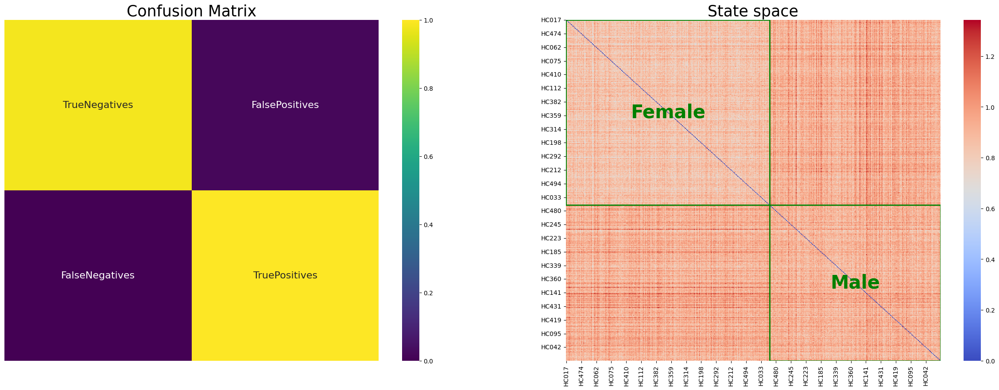

In [49]:
names = [['TrueNegatives', 'FalsePositives'],['FalseNegatives','TruePositives']]
fig, ax = plt.subplots(1, 2, figsize = (30,10))
sns.heatmap(best_C, cmap="viridis", annot=names, annot_kws={'fontsize': 16}, fmt='s', ax = ax[0])
ax[0].set_title('Confusion Matrix', fontsize = 25)
ax[0].set_xticks([])
ax[0].set_yticks([])

A = squareform(pdist(EVC))
ord = np.argsort(y_pred)
A_ord = A[np.ix_(ord, ord)]

inv_map = {v: ('Male' if k == 'M' else 'Female') for k, v in best_map.items()}
cluster_labels = [inv_map[i] for i in sorted(inv_map.keys())]

sns.heatmap(A_ord, cmap="coolwarm", ax = ax[1])
rect_state_labels(y_pred, ax[1], 'g', class_labels=cluster_labels)
subj_ords = list(np.array(subject_ids , dtype = str)[ord])

ax[1].set_xticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_xticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].set_yticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_yticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].tick_params(axis='y', labelrotation=360)
ax[1].set_title('State space', fontsize = 25)

In [50]:
np.unique(df_subjects.Gender.to_numpy(), return_counts = True)

(array(['F', 'M'], dtype=object), array([268, 232]))

### 2) Now, try to cluster closeness centralities in functional brain networks to see if they predict age interval.
#### Hyperparameters:
##### •Functional Connectivity: Euclidean Distance
##### •Thresholding: None
##### •Predictor: Closeness Centrality
##### •Predicted: Subject Age

In [51]:
# Initialize an empty array to store node strengths for each subject (rows) and each brain region/ROI (columns).
CLC = np.zeros((n_subjects, n_rois))

# Loop through each subject by their ID
for i, idx in enumerate(subject_ids):

    # Step 1: Compute the adjacency matrix for the subject using cross correlation between all ROI time series.
    # The resulting matrix represents functional connectivity strength between every pair of brain regions.
    adjacency_matrix = euclidean_dist(TS[idx])

    # Step 2: Convert the adjacency matrix into an igraph Graph object.
    G = make_igraph(adjacency_matrix, drctd=False)

    # Step 3: Compute nodal strengths for this subject's graph.
    CLC[i, :] = compute_closeness_centrality(G)

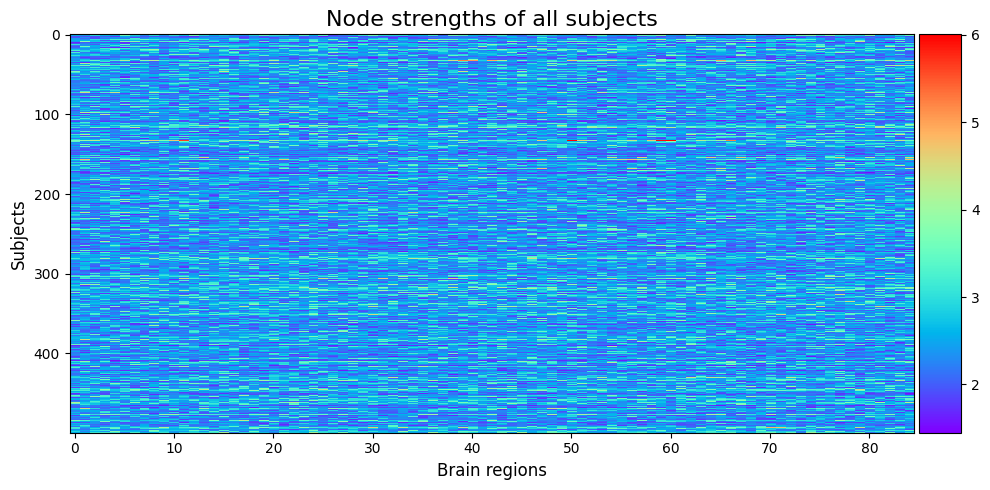

In [52]:
fig, ax = plt.subplots(1,1, figsize = (10,5))
im = ax.imshow(CLC, aspect = 'auto', interpolation = 'none', cmap = 'rainbow')
ax.set_title('Node strengths of all subjects', fontsize = 16)
ax.set_xlabel('Brain regions', fontsize = 12)
ax.set_ylabel('Subjects', fontsize = 12)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax)
plt.tight_layout()

In [53]:
# Extract the class labels (e.g., ["18-22", "22-28", "28-36", "36+"] from the age mapping dictionary.
# These will be used to define the ordering of classes in the confusion matrix.
labels = np.unique(df_subjects['Age'].to_numpy())
# -------------------------------------------------------------------------
# K-means clustering based on eigenvector centrality (STR)
# -------------------------------------------------------------------------

# Step 1: 'Whiten' (normalize) the STR feature matrix so that each feature (ROI) has unit variance.
# This ensures that no brain region dominates clustering simply because its values are larger in magnitude.
whitened = whiten(CLC)

# Step 2: Run k-means clustering to divide subjects into groups equal to the number of gender labels (here, 4: "18-22", "22-28", "28-36", "36+").
# - centroid: the cluster centers
# - y_pred: the cluster assignment (0, 1, 2, 3) for each subject
centroid, y_pred = kmeans2(whitened, len(labels), minit='++')

In [54]:
# Step 3: Compute a confusion matrix comparing true age labels (y_true) with the cluster-derived predictions (y_pred),
# while accounting for the fact that k-means cluster labels (0, 1, 2, 3) are arbitrary.
#
# To correctly align cluster labels with true age labels, we test all possible permutations of the age label encoding
# and choose the mapping that yields the highest overall accuracy.

# Extract the "Age" column from the dataframe as a Python list.
age = df_subjects.Age.to_list()

# Initialize placeholders to store the best mapping results
best_acc = 0          # Highest accuracy encountered so far
best_C = None      # Confusion matrix corresponding to best accuracy
best_map = None       # Mapping dictionary that produced best accuracy

# Define the original categorical-to-numeric mapping:  though this will be permuted below.
age_key = {"18-22":0, "22-28":1, "28-36":2, "36+":3}

# Loop over all possible permutations of age label values.
for perm in permutations(age_key.values()):

    # Reassign permuted numeric values to the same keys ('M','F')
    age_key_perm = dict(zip(age_key.keys(), perm))

    # Convert the true gender labels to numeric values using this permutation. np.vectorize applies the dictionary lookup element-wise across the list.
    y_true = np.vectorize(age_key_perm.get)(age)

    # Compute confusion matrix between true labels and predicted cluster assignments. 'normalize="true"' makes each row sum to 1 (proportion per true class).
    # The label order (0,1,2,3) is determined by the current permuted mapping.
    C = confusion_matrix(y_true, y_pred, labels=list(age_key_perm.values()), normalize='true')

    # Compute overall accuracy as the trace (correct predictions) divided by total.
    acc = np.trace(C) / np.sum(C)

    # Update best results if this permutation yields higher accuracy.
    if acc > best_acc:
        best_acc = acc
        best_C = C
        best_map = age_key_perm

# Display the best-performing label mapping and corresponding confusion matrix.
print("Best mapping:", best_map)
print("Best accuracy:", best_acc)
print("Best confusion matrix:\n", best_C)

Best mapping: {'18-22': 1, '22-28': 3, '28-36': 0, '36+': 2}
Best accuracy: 0.5830319969301386
Best confusion matrix:
 [[0.43548387 0.0483871  0.51612903 0.        ]
 [0.         0.51704545 0.0625     0.42045455]
 [0.05434783 0.45108696 0.45652174 0.03804348]
 [0.         0.07692308 0.         0.92307692]]


Text(0.5, 1.0, 'State space')

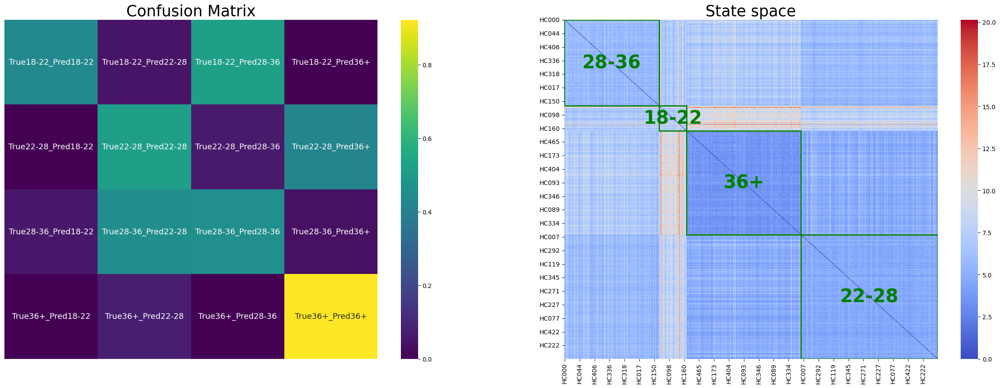

In [55]:
names = [[f"True{ti}_Pred{pj}" for pj in labels] for ti in labels]

fig, ax = plt.subplots(1, 2, figsize = (30,10))
sns.heatmap(best_C, cmap="viridis", annot=names, annot_kws={'fontsize': 13}, fmt='s', ax = ax[0])
ax[0].set_title('Confusion Matrix', fontsize = 25)
ax[0].set_xticks([])
ax[0].set_yticks([])

A = squareform(pdist(CLC))
ord = np.argsort(y_pred)
A_ord = A[np.ix_(ord, ord)]

# Invert it → cluster index → class label
inv_map = {v: k for k, v in best_map.items()}
# Build ordered list of class labels according to sorted cluster indices
cluster_labels = [inv_map[i] for i in sorted(inv_map.keys())]

sns.heatmap(A_ord, cmap="coolwarm", ax = ax[1])
rect_state_labels(y_pred, ax[1], 'g', class_labels=cluster_labels)
subj_ords = list(np.array(subject_ids , dtype = str)[ord])

ax[1].set_xticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_xticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].set_yticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_yticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].tick_params(axis='y', labelrotation=360)
ax[1].set_title('State space', fontsize = 25)

In [56]:
np.unique(df_subjects.Age.to_numpy(), return_counts = True)

(array(['18-22', '22-28', '28-36', '36+'], dtype=object),
 array([ 62, 176, 184,  78]))

### What went wrong? Which hyperparameters to tune? Let's try again with a different selection:
#### Hyper parameters:
##### •Functional Connectivity: Euclidean Distance
##### •Thresholding: 0.6
##### •Predictor: Closeness Centrality
##### •Predicted: Subject Age

In [57]:
# Initialize an empty array to store node strengths for each subject (rows) and each brain region/ROI (columns).
CLC = np.zeros((n_subjects, n_rois))

# Loop through each subject by their ID
for i, idx in enumerate(subject_ids):

    # Step 1: Compute the adjacency matrix for the subject using cross correlation between all ROI time series.
    # The resulting matrix represents functional connectivity strength between every pair of brain regions.
    adjacency_matrix = euclidean_dist(TS[idx])
    thresholded_adjacency_matrix = threshold_by_percentile(adjacency_matrix, 0.4)

    # Step 2: Convert the adjacency matrix into an igraph Graph object.
    G = make_igraph(thresholded_adjacency_matrix, drctd=False)

    # Step 3: Compute nodal strengths for this subject's graph.
    CLC[i, :] = compute_closeness_centrality(G)

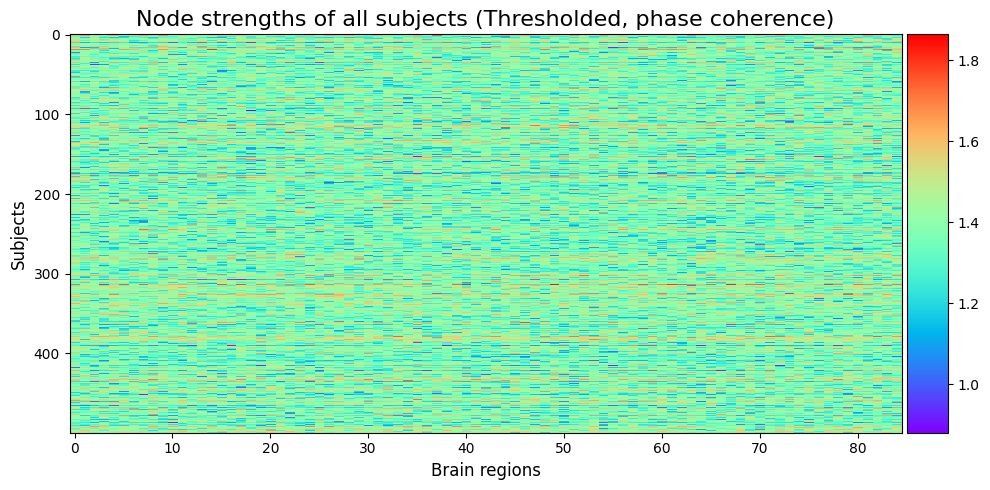

In [58]:
fig, ax = plt.subplots(1,1, figsize = (10,5))
im = ax.imshow(CLC, aspect = 'auto', interpolation = 'none', cmap = 'rainbow')
ax.set_title('Node strengths of all subjects (Thresholded, phase coherence)', fontsize = 16)
ax.set_xlabel('Brain regions', fontsize = 12)
ax.set_ylabel('Subjects', fontsize = 12)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax)
plt.tight_layout()

In [59]:
# Extract the class labels (e.g., ["18-22", "22-28", "28-36", "36+"] from the age mapping dictionary.
# These will be used to define the ordering of classes in the confusion matrix.
labels = np.unique(df_subjects['Age'].to_numpy())
# -------------------------------------------------------------------------
# K-means clustering based on eigenvector centrality (STR)
# -------------------------------------------------------------------------

# Step 1: 'Whiten' (normalize) the STR feature matrix so that each feature (ROI) has unit variance.
# This ensures that no brain region dominates clustering simply because its values are larger in magnitude.
whitened = whiten(CLC)

# Step 2: Run k-means clustering to divide subjects into groups equal to the number of gender labels (here, 4: "18-22", "22-28", "28-36", "36+").
# - centroid: the cluster centers
# - y_pred: the cluster assignment (0, 1, 2, 3) for each subject
centroid, y_pred = kmeans2(whitened, len(labels), minit='++')

In [60]:
# Step 3: Compute a confusion matrix comparing true age labels (y_true) with the cluster-derived predictions (y_pred),
# while accounting for the fact that k-means cluster labels (0, 1, 2, 3) are arbitrary.
#
# To correctly align cluster labels with true age labels, we test all possible permutations of the age label encoding
# and choose the mapping that yields the highest overall accuracy.

# Extract the "Age" column from the dataframe as a Python list.
age = df_subjects.Age.to_list()

# Initialize placeholders to store the best mapping results
best_acc = 0          # Highest accuracy encountered so far
best_C = None      # Confusion matrix corresponding to best accuracy
best_map = None       # Mapping dictionary that produced best accuracy

# Define the original categorical-to-numeric mapping:  though this will be permuted below.
age_key = {"18-22":0, "22-28":1, "28-36":2, "36+":3}

# Loop over all possible permutations of age label values.
for perm in permutations(age_key.values()):

    # Reassign permuted numeric values to the same keys ('M','F')
    age_key_perm = dict(zip(age_key.keys(), perm))

    # Convert the true gender labels to numeric values using this permutation. np.vectorize applies the dictionary lookup element-wise across the list.
    y_true = np.vectorize(age_key_perm.get)(age)

    # Compute confusion matrix between true labels and predicted cluster assignments. 'normalize="true"' makes each row sum to 1 (proportion per true class).
    # The label order (0,1,2,3) is determined by the current permuted mapping.
    C = confusion_matrix(y_true, y_pred, labels=list(age_key_perm.values()), normalize='true')

    # Compute overall accuracy as the trace (correct predictions) divided by total.
    acc = np.trace(C) / np.sum(C)

    # Update best results if this permutation yields higher accuracy.
    if acc > best_acc:
        best_acc = acc
        best_C = C
        best_map = age_key_perm

# Display the best-performing label mapping and corresponding confusion matrix.
print("Best mapping:", best_map)
print("Best accuracy:", best_acc)
print("Best confusion matrix:\n", best_C)

Best mapping: {'18-22': 2, '22-28': 1, '28-36': 0, '36+': 3}
Best accuracy: 0.972270256916996
Best confusion matrix:
 [[1.         0.         0.         0.        ]
 [0.         0.94886364 0.         0.05113636]
 [0.         0.05978261 0.94021739 0.        ]
 [0.         0.         0.         1.        ]]


Text(0.5, 1.0, 'State space')

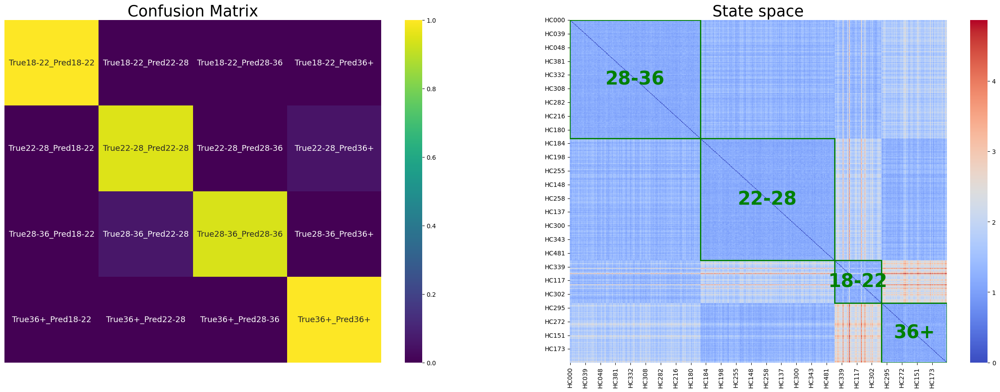

In [61]:
names = [[f"True{ti}_Pred{pj}" for pj in labels] for ti in labels]

fig, ax = plt.subplots(1, 2, figsize = (30,10))
sns.heatmap(best_C, cmap="viridis", annot=names, annot_kws={'fontsize': 13}, fmt='s', ax = ax[0])
ax[0].set_title('Confusion Matrix', fontsize = 25)
ax[0].set_xticks([])
ax[0].set_yticks([])

A = squareform(pdist(CLC))
ord = np.argsort(y_pred)
A_ord = A[np.ix_(ord, ord)]

# Invert it → cluster index → class label
inv_map = {v: k for k, v in best_map.items()}
# Build ordered list of class labels according to sorted cluster indices
cluster_labels = [inv_map[i] for i in sorted(inv_map.keys())]

sns.heatmap(A_ord, cmap="coolwarm", ax = ax[1])
rect_state_labels(y_pred, ax[1], 'g', class_labels=cluster_labels)
subj_ords = list(np.array(subject_ids , dtype = str)[ord])

ax[1].set_xticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_xticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].set_yticks([i*20 +0.5 for i in range(int(len(subj_ords)/20))])
ax[1].set_yticklabels([idx for i, idx in enumerate(subj_ords) if i%20 == 0])
ax[1].tick_params(axis='y', labelrotation=360)
ax[1].set_title('State space', fontsize = 25)

## Dynamic functional connectivity


In [62]:
def bin_time_series(array, binsize):
    #input: txn matrix
    #returns: binned time series i.e. l x n x binsize

    duration, N = array.shape # number of neurons
    L = int(duration/binsize) # number of resulting layers

    A = np.zeros((L,binsize,N))
    for l in range(L):
        A[l] = array[l*binsize:(l+1)*binsize]
    return(A)

In [63]:
binsize = 400
snapshots = int(T/binsize)

binned_TS = bin_time_series(TS[idx], binsize)

dynamic_adjacency_matrices = {"cross_corr": np.array([correlation(binned_TS[s]) for s in range(snapshots)]),
                              "euclidean_distance": np.array([euclidean_dist(binned_TS[s]) for s in range(snapshots)]),
                              "mutual_information": np.array([mutual_information(binned_TS[s]) for s in range(snapshots)]),
                              "coherence_phase": np.array([coherence_phase(binned_TS[s]) for s in range(snapshots)])}

# example: access the cross-correlation matrix
print('Dynamic functional connectivity of shape:',dynamic_adjacency_matrices["cross_corr"].shape)

Dynamic functional connectivity of shape: (3, 85, 85)


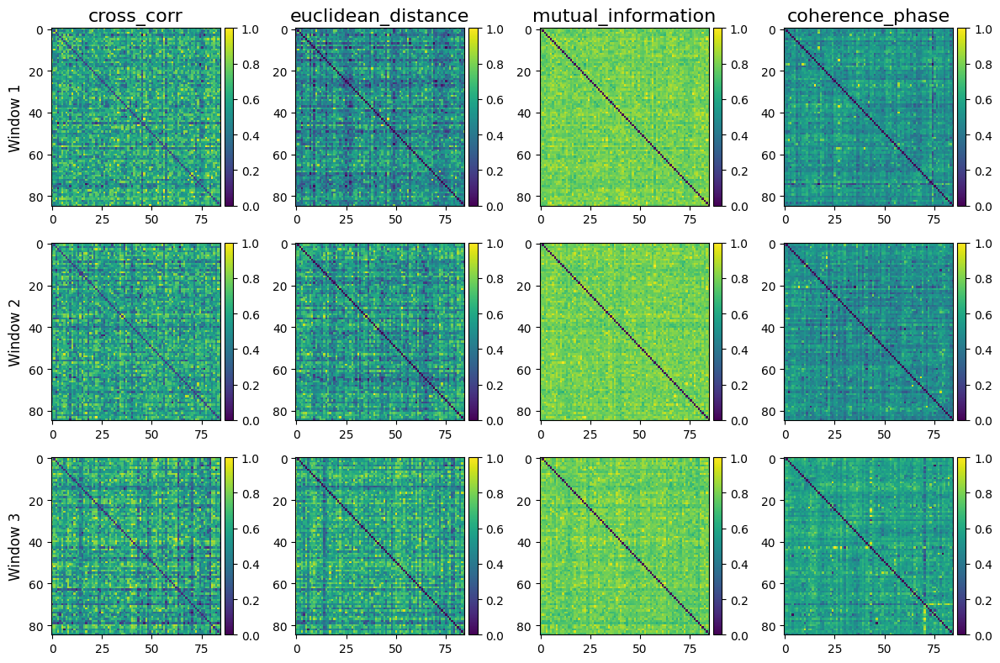

In [64]:
fig,ax = plt.subplots(snapshots,4,figsize= (12,8))
for i, adj in enumerate(dynamic_adjacency_matrices):
    for s in range(snapshots):
        im1 = ax[s][i].imshow(dynamic_adjacency_matrices[adj][s], aspect = 'auto', interpolation = 'none', vmin = np.array(dynamic_adjacency_matrices[adj]).min(), vmax = np.array(dynamic_adjacency_matrices[adj]).max())
        divider = make_axes_locatable(ax[s][i])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        fig.colorbar(im1, cax=cax)
        ax[s][0].set_ylabel('Window %d'%(s+1), fontsize = 12)
    ax[0][i].set_title("%s"%adj, fontsize = 16)
plt.tight_layout()

In [65]:
binsizes = [100,200,300,400,600]
windowed_adjacency_matrices = {}
for binsize in binsizes:
    snapshots = int(T/binsize)
    binned_ts = bin_time_series(TS[idx], binsize)
    print('Number of Snapshots is %d, when binsize is %d'%(len(binned_ts),binsize))

    windowed_adjacency_matrices[binsize] = [correlation(binned_ts[s]) for s in range(snapshots)]

Number of Snapshots is 12, when binsize is 100
Number of Snapshots is 6, when binsize is 200
Number of Snapshots is 4, when binsize is 300
Number of Snapshots is 3, when binsize is 400
Number of Snapshots is 2, when binsize is 600


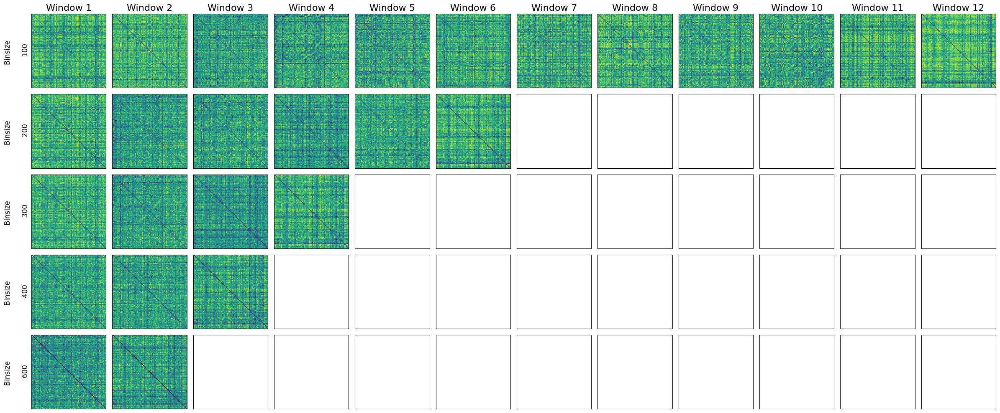

In [66]:
fig,ax = plt.subplots(len(binsizes),12,figsize= (24,10))
for b, binsize in enumerate(binsizes):
    snapshots = int(T/binsize)
    for s in range(snapshots):
        im1 = ax[b][s].imshow(windowed_adjacency_matrices[binsize][s], aspect = 'auto', interpolation = 'none', vmin = np.array(windowed_adjacency_matrices[binsize]).min(), vmax = np.array(windowed_adjacency_matrices[binsize]).max())
        ax[0][s].set_title('Window %d'%(s+1), fontsize = 16)
    for s in range(12):
        ax[b][s].tick_params(left=False, bottom=False,labelleft=False, labelbottom=False)
    ax[b][0].set_ylabel(f"Binsize \n\n %s"%binsize, fontsize = 12)
plt.tight_layout()

In [67]:
thresholded_windowed_adjacency_matrices = {}
binsize = 100
snapshots = int(T/binsize)
global_cc, global_pl = [],[]
for s in range(snapshots):
    thresholded_windowed_adjacency_matrices[s] = threshold_by_percentile(windowed_adjacency_matrices[binsize][s], 0.4)
    G = make_igraph(thresholded_windowed_adjacency_matrices[s])
    global_cc.append(compute_global_clusteringcoef(G))
    global_pl.append(compute_pathlengths(G).mean())

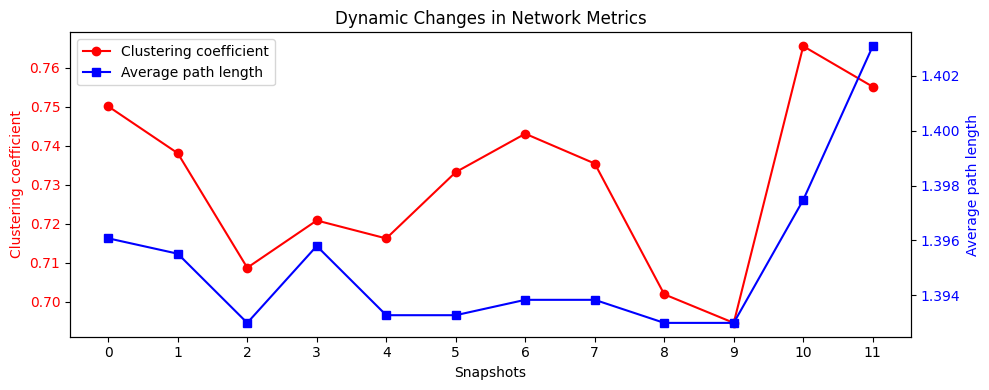

In [68]:
fig, ax1 = plt.subplots(figsize=(10, 4))

# First y-axis → clustering coefficient
ax1.plot(global_cc, marker='o', color='r', label='Clustering coefficient')
ax1.set_xlabel('Snapshots', fontsize=10)
ax1.set_ylabel('Clustering coefficient', color='r', fontsize=10)
ax1.tick_params(axis='y', labelcolor='r')

# Second y-axis → average path length
ax2 = ax1.twinx()
ax2.plot(global_pl, marker='s', color='b', label='Average path length')
ax2.set_ylabel('Average path length', color='b', fontsize=10)
ax2.tick_params(axis='y', labelcolor='b')

# Title and x-axis formatting
ax1.set_title('Dynamic Changes in Network Metrics', fontsize=12)
ax1.set_xticks(range(len(global_cc)))

# Optional: combine legends from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='best')

plt.tight_layout()
plt.show()

In [69]:
df_subjects

,Subject,Gender,Age,BMI,IQ
0,HC000,M,28-36,27.8,85
1,HC001,M,18-22,36.4,78
2,HC002,M,28-36,33.4,79
3,HC003,M,22-28,29.4,83
4,HC004,M,36+,27.9,91
...,...,...,...,...,...
495,HC495,M,22-28,25.7,99
496,HC496,M,28-36,10.6,113
497,HC497,M,28-36,14.8,96
498,HC498,F,18-22,11.6,121


## Workshop project idea 1  
#### Try to predict IQ from functional connectivity with highest accuracy.
#### Use low (70-84), average (85-114) and high (115-130) IQ bins.

#### Hyperparamaters to consider
##### 1) You can use either wighted or binarized FC.
##### 2) You can use a range of thresholding values. Moreover you can either try value based or eprcentage based clustering.
##### 3) Use different graph theory metrics? (e.g. degree, strength, path lengths, clustering coefficient, OR degree-, betweenness-, closeness-, eigenvector-centrality)
##### 4 (bonus) Instead of kmeans, can you implement other types of unsupervised clustering methods for higher accuracy, for example hierarchical clustering?

## Workshop project idea 2 (Advanced)  
#### Try to predict BMI from **dynamic** functional connectivity with highest accuracy.
#### Use these bins for categorical classification 0: (10-18.5), 1: (18.5-25), 2: (25-30), 3: (30-40)

#### Hyperparamaters to consider
##### 1) You can use either wighted or binarized FC.
##### 2) You can use a range of thresholding values. Moreover you can either try value based or eprcentage based clustering.
##### 3) You can use different lengths of windows.
##### 4) Use different graph theory metrics? (in addition to what's above, consider Small-worldedness coefficient)
##### 5) (bonus) Instead of kmeans, can you implement other types of unsupervised clustering methods for higher accuracy, for example hierarchical clustering?

## Workshop project idea 3 (More Advanced)  
#### Try to predict BMI (or IQ) using contionus classification as opposed to categorical.